# Catalogue d'indicateurs techniques et de patterns de chandeliers japonais

**Auteur :** Trustia


Bienvenue dans ce catalogue sur l'analyse des indicateurs financiers et des patterns de chandeliers japonais.

<div style="page-break-after: always;"></div>



# Introduction

Ce rapport présente une analyse approfondie des indicateurs financiers et des patterns de chandeliers japonais utilisés dans le trading. Nous explorerons différentes catégories d'indicateurs techniques et discuterons de leur importance dans la prise de décisions d'investissement. De plus, nous examinerons les patterns de chandeliers japonais et leur rôle dans l'identification des tendances du marché.

L'objectif de ce rapport est de fournir une compréhension claire des outils analytiques disponibles pour les traders et les investisseurs, en mettant l'accent sur la façon dont ces indicateurs et patterns peuvent être appliqués aux données du marché pour prévoir les mouvements de prix.

<div style="page-break-after: always;"></div>


In [19]:

 # Import necessary libraries



import yfinance as yf
import talib

%matplotlib inline

# Récupérer les données BTC
data = yf.download('BTC-USD', start='2023-01-01', end='2024-09-17')
data = data[['Close', 'High', 'Low', 'Open', 'Volume']].copy() 
data.dropna(inplace=True)

[*********************100%***********************]  1 of 1 completed


In [20]:
# Définir les catégories et les indicateurs associés
categories = [{
    'name': 'Overlap Studies',
    'description': 'Ces indicateurs étudient le chevauchement des prix par rapport à diverses moyennes ou bandes.',
    'indicators': [
        {
            'name': 'Bollinger Bands (BBANDS)',
            'description': 'Bollinger Bands se compose de 3 bandes, définissant une zone de volatilité autour de la moyenne mobile.',
            'func': talib.BBANDS,
            'args': ['Close'],
            'params': {'timeperiod': 5, 'nbdevup': 2, 'nbdevdn': 2, 'matype': 0},
            'multiple': True,
            'new_columns': ['Upper Band', 'Middle Band', 'Lower Band'],
            'plot_params': {'colors': ['blue', 'green', 'red'], 'type': 'line'}
        },
        {
            'name': 'Double Exponential Moving Average (DEMA)',
            'description': 'La DEMA lisse les prix de manière plus rapide que la moyenne mobile simple.',
            'func': talib.DEMA,
            'args': ['Close'],
            'params': {'timeperiod': 30},
            'multiple': False,
            'plot_params': {'color': 'purple', 'type': 'line'}
        },
        {
            'name': 'Exponential Moving Average (EMA)',
            'description': 'La moyenne mobile exponentielle donne plus de poids aux prix récents.',
            'func': talib.EMA,
            'args': ['Close'],
            'params': {'timeperiod': 30},
            'multiple': False,
            'plot_params': {'color': 'blue', 'type': 'line'}
        },
        {
            'name': 'Hilbert Transform - Instantaneous Trendline (HT_TRENDLINE)',
            'description': 'Hilbert Transform qui fournit une tendance instantanée.',
            'func': talib.HT_TRENDLINE,
            'args': ['Close'],
            'multiple': False,
            'plot_params': {'color': 'orange', 'type': 'line'}
        },
        {
            'name': 'Kaufman Adaptive Moving Average (KAMA)',
            'description': 'La KAMA est une moyenne mobile adaptive conçue pour réagir rapidement aux mouvements de prix.',
            'func': talib.KAMA,
            'args': ['Close'],
            'params': {'timeperiod': 30},
            'multiple': False,
            'plot_params': {'color': 'green', 'type': 'line'}
        },
        {
            'name': 'Moving Average (MA)',
            'description': 'Moyenne mobile simple basée sur le prix moyen des périodes passées.',
            'func': talib.MA,
            'args': ['Close'],
            'params': {'timeperiod': 30, 'matype': 0},
            'multiple': False,
            'plot_params': {'color': 'red', 'type': 'line'}
        },
        {
            'name': 'MESA Adaptive Moving Average (MAMA)',
            'description': 'Une moyenne mobile adaptative basée sur le cycle du marché.',
            'func': talib.MAMA,
            'args': ['Close'],
            'params': {'fastlimit': 0.5, 'slowlimit': 0.05},
            'multiple': True,
            'new_columns': ['MAMA', 'FAMA'],
            'plot_params': {'colors': ['blue', 'red'], 'type': 'line'}
        },
        {
            'name': 'Moving Average with Variable Period (MAVP)',
            'description': 'Une moyenne mobile où la période est variable.',
            'func': talib.MAVP,
            'args': ['Close', 'Close'],  # periods can be based on another series like 'Close'
            'params': {'minperiod': 2, 'maxperiod': 30, 'matype': 0},
            'multiple': False,
            'plot_params': {'color': 'purple', 'type': 'line'}
        },
        {
            'name': 'MidPoint over Period (MIDPOINT)',
            'description': 'Le point médian sur une période spécifiée.',
            'func': talib.MIDPOINT,
            'args': ['Close'],
            'params': {'timeperiod': 14},
            'multiple': False,
            'plot_params': {'color': 'brown', 'type': 'line'}
        },
        {
            'name': 'Midpoint Price over Period (MIDPRICE)',
            'description': 'Le prix médian basé sur les hauts et bas d\'une période spécifiée.',
            'func': talib.MIDPRICE,
            'args': ['High', 'Low'],
            'params': {'timeperiod': 14},
            'multiple': False,
            'plot_params': {'color': 'darkblue', 'type': 'line'}
        },
        {
            'name': 'Parabolic SAR (SAR)',
            'description': 'Le Parabolic SAR identifie les inversions de tendance dans un marché.',
            'func': talib.SAR,
            'args': ['High', 'Low'],
            'params': {'acceleration': 0.02, 'maximum': 0.2},
            'multiple': False,
            'plot_params': {'color': 'black', 'type': 'scatter'}
        },
        {
            'name': 'Parabolic SAR - Extended (SAREXT)',
            'description': 'Une version étendue du Parabolic SAR avec des réglages supplémentaires.',
            'func': talib.SAREXT,
            'args': ['High', 'Low'],
            'params': {'startvalue': 0, 'offsetonreverse': 0, 'accelerationinitlong': 0, 'accelerationlong': 0, 'accelerationmaxlong': 0,
                       'accelerationinitshort': 0, 'accelerationshort': 0, 'accelerationmaxshort': 0},
            'multiple': False,
            'plot_params': {'color': 'orange', 'type': 'scatter'}
        },
        {
            'name': 'Simple Moving Average (SMA)',
            'description': 'La moyenne mobile simple calcule la moyenne des prix sur une période donnée.',
            'func': talib.SMA,
            'args': ['Close'],
            'params': {'timeperiod': 30},
            'multiple': False,
            'plot_params': {'color': 'blue', 'type': 'line'}
        },
        {
            'name': 'Triple Exponential Moving Average (T3)',
            'description': 'Une moyenne mobile triplement exponentielle pour plus de réactivité.',
            'func': talib.T3,
            'args': ['Close'],
            'params': {'timeperiod': 5, 'vfactor': 0.7},
            'multiple': False,
            'plot_params': {'color': 'cyan', 'type': 'line'}
        },
        {
            'name': 'Triple Exponential Moving Average (TEMA)',
            'description': 'La TEMA est utilisée pour lisser les fluctuations du prix.',
            'func': talib.TEMA,
            'args': ['Close'],
            'params': {'timeperiod': 30},
            'multiple': False,
            'plot_params': {'color': 'yellow', 'type': 'line'}
        },
        {
            'name': 'Triangular Moving Average (TRIMA)',
            'description': 'La moyenne mobile triangulaire donne plus de poids aux prix au centre de la période.',
            'func': talib.TRIMA,
            'args': ['Close'],
            'params': {'timeperiod': 30},
            'multiple': False,
            'plot_params': {'color': 'lightblue', 'type': 'line'}
        },
        {
            'name': 'Weighted Moving Average (WMA)',
            'description': 'La moyenne mobile pondérée donne plus d\'importance aux prix récents.',
            'func': talib.WMA,
            'args': ['Close'],
            'params': {'timeperiod': 30},
            'multiple': False,
            'plot_params': {'color': 'magenta', 'type': 'line'}
        }
    ]
}, {
    'name': 'Momentum Indicator Functions',
    'description': 'Ces indicateurs mesurent la vitesse ou la force des mouvements des prix.',
    'indicators': [
        {
            'name': 'Average Directional Movement Index (ADX)',
            'description': 'L\'ADX mesure la force de la tendance.',
            'func': talib.ADX,
            'args': ['High', 'Low', 'Close'],
            'params': {'timeperiod': 14},
            'multiple': False,
            'plot_params': {'color': 'orange', 'type': 'line'}
        },
        {
            'name': 'Average Directional Movement Index Rating (ADXR)',
            'description': 'L\'ADXR est une version lissée de l\'ADX.',
            'func': talib.ADXR,
            'args': ['High', 'Low', 'Close'],
            'params': {'timeperiod': 14},
            'multiple': False,
            'plot_params': {'color': 'purple', 'type': 'line'}
        },
        {
            'name': 'Absolute Price Oscillator (APO)',
            'description': 'Le différentiel entre deux moyennes mobiles pour indiquer la direction du prix.',
            'func': talib.APO,
            'args': ['Close'],
            'params': {'fastperiod': 12, 'slowperiod': 26, 'matype': 0},
            'multiple': False,
            'plot_params': {'color': 'purple', 'type': 'line'}
        },
        {
            'name': 'Aroon (AROON)',
            'description': 'Indicateur qui montre si une tendance est présente en comparant les hauts et les bas.',
            'func': talib.AROON,
            'args': ['High', 'Low'],
            'params': {'timeperiod': 14},
            'multiple': True,
            'new_columns': ['Aroon Down', 'Aroon Up'],
            'plot_params': {'colors': ['blue', 'red'], 'type': 'line'}
        },
        {
            'name': 'Aroon Oscillator (AROONOSC)',
            'description': 'L\'oscillateur Aroon montre la force relative d\'une tendance.',
            'func': talib.AROONOSC,
            'args': ['High', 'Low'],
            'params': {'timeperiod': 14},
            'multiple': False,
            'plot_params': {'color': 'green', 'type': 'line'}
        },
        {
            'name': 'Balance of Power (BOP)',
            'description': 'L\'équilibre des pouvoirs est un indicateur qui mesure la pression des acheteurs et des vendeurs.',
            'func': talib.BOP,
            'args': ['Open', 'High', 'Low', 'Close'],
            'multiple': False,
            'plot_params': {'color': 'cyan', 'type': 'line'}
        },
        {
            'name': 'Commodity Channel Index (CCI)',
            'description': 'Mesure la déviation du prix par rapport à sa moyenne.',
            'func': talib.CCI,
            'args': ['High', 'Low', 'Close'],
            'params': {'timeperiod': 14},
            'multiple': False,
            'plot_params': {'color': 'blue', 'type': 'line'}
        },
        {
            'name': 'Chande Momentum Oscillator (CMO)',
            'description': 'Le CMO mesure la vitesse du changement du prix.',
            'func': talib.CMO,
            'args': ['Close'],
            'params': {'timeperiod': 14},
            'multiple': False,
            'plot_params': {'color': 'red', 'type': 'line'}
        },
        {
            'name': 'Directional Movement Index (DX)',
            'description': 'Indicateur qui mesure la force de la tendance.',
            'func': talib.DX,
            'args': ['High', 'Low', 'Close'],
            'params': {'timeperiod': 14},
            'multiple': False,
            'plot_params': {'color': 'brown', 'type': 'line'}
        },
        {
            'name': 'Moving Average Convergence/Divergence (MACD)',
            'description': 'Indicateur de momentum basé sur la différence entre deux moyennes mobiles.',
            'func': talib.MACD,
            'args': ['Close'],
            'params': {'fastperiod': 12, 'slowperiod': 26, 'signalperiod': 9},
            'multiple': True,
            'new_columns': ['MACD', 'Signal', 'Hist'],
            'plot_params': {'colors': ['blue', 'red', 'gray'], 'type': 'line'}
        },
        {
            'name': 'MACD with controllable MA type (MACDEXT)',
            'description': 'Une version du MACD avec des types de moyennes mobiles personnalisables.',
            'func': talib.MACDEXT,
            'args': ['Close'],
            'params': {'fastperiod': 12, 'fastmatype': 0, 'slowperiod': 26, 'slowmatype': 0, 'signalperiod': 9, 'signalmatype': 0},
            'multiple': True,
            'new_columns': ['MACD_EXT', 'Signal_EXT', 'Hist_EXT'],
            'plot_params': {'colors': ['purple', 'orange', 'green'], 'type': 'line'}
        },
        {
            'name': 'MACD Fix 12/26 (MACDFIX)',
            'description': 'MACD fixe avec des paramètres standards.',
            'func': talib.MACDFIX,
            'args': ['Close'],
            'params': {'signalperiod': 9},
            'multiple': True,
            'new_columns': ['MACD_FIX', 'Signal_FIX', 'Hist_FIX'],
            'plot_params': {'colors': ['yellow', 'red', 'blue'], 'type': 'line'}
        },
        {
            'name': 'Money Flow Index (MFI)',
            'description': 'Indicateur de momentum basé sur le volume et le prix.',
            'func': talib.MFI,
            'args': ['High', 'Low', 'Close', 'Volume'],
            'params': {'timeperiod': 14},
            'multiple': False,
            'plot_params': {'color': 'green', 'type': 'line'}
        },
        {
            'name': 'Minus Directional Indicator (MINUS_DI)',
            'description': 'Mesure la force de la pression vendeuse.',
            'func': talib.MINUS_DI,
            'args': ['High', 'Low', 'Close'],
            'params': {'timeperiod': 14},
            'multiple': False,
            'plot_params': {'color': 'red', 'type': 'line'}
        },
        {
            'name': 'Minus Directional Movement (MINUS_DM)',
            'description': 'Indicateur qui mesure les mouvements baissiers.',
            'func': talib.MINUS_DM,
            'args': ['High', 'Low'],
            'params': {'timeperiod': 14},
            'multiple': False,
            'plot_params': {'color': 'brown', 'type': 'line'}
        },
        {
            'name': 'Momentum (MOM)',
            'description': 'Mesure la vitesse du changement de prix.',
            'func': talib.MOM,
            'args': ['Close'],
            'params': {'timeperiod': 10},
            'multiple': False,
            'plot_params': {'color': 'blue', 'type': 'line'}
        },
        {
            'name': 'Plus Directional Indicator (PLUS_DI)',
            'description': 'Mesure la force de la pression acheteuse.',
            'func': talib.PLUS_DI,
            'args': ['High', 'Low', 'Close'],
            'params': {'timeperiod': 14},
            'multiple': False,
            'plot_params': {'color': 'green', 'type': 'line'}
        },
        {
            'name': 'Plus Directional Movement (PLUS_DM)',
            'description': 'Indicateur qui mesure les mouvements haussiers.',
            'func': talib.PLUS_DM,
            'args': ['High', 'Low'],
            'params': {'timeperiod': 14},
            'multiple': False,
            'plot_params': {'color': 'blue', 'type': 'line'}
        },
        {
            'name': 'Percentage Price Oscillator (PPO)',
            'description': 'Un oscillateur basé sur le prix qui exprime les changements en pourcentage.',
            'func': talib.PPO,
            'args': ['Close'],
            'params': {'fastperiod': 12, 'slowperiod': 26, 'matype': 0},
            'multiple': False,
            'plot_params': {'color': 'purple', 'type': 'line'}
        },
        {
            'name': 'Rate of Change (ROC)',
            'description': 'Mesure le pourcentage de changement entre le prix actuel et un prix passé.',
            'func': talib.ROC,
            'args': ['Close'],
            'params': {'timeperiod': 10},
            'multiple': False,
            'plot_params': {'color': 'red', 'type': 'line'}
        },
        {
            'name': 'Relative Strength Index (RSI)',
            'description': 'Indicateur de momentum populaire qui compare les gains récents aux pertes récentes.',
            'func': talib.RSI,
            'args': ['Close'],
            'params': {'timeperiod': 14},
            'multiple': False,
            'plot_params': {'color': 'blue', 'type': 'line'}
        },
        {
            'name': 'Stochastic Oscillator (STOCH)',
            'description': 'Indicateur de momentum qui compare le prix de clôture au range de prix sur une période donnée.',
            'func': talib.STOCH,
            'args': ['High', 'Low', 'Close'],
            'params': {'fastk_period': 5, 'slowk_period': 3, 'slowk_matype': 0, 'slowd_period': 3, 'slowd_matype': 0},
            'multiple': True,
            'new_columns': ['Slow K', 'Slow D'],
            'plot_params': {'colors': ['blue', 'red'], 'type': 'line'}
        },
        {
            'name': 'Williams %R (WILLR)',
            'description': 'Mesure si le prix est proche des hauts ou des bas sur une période donnée.',
            'func': talib.WILLR,
            'args': ['High', 'Low', 'Close'],
            'params': {'timeperiod': 14},
            'multiple': False,
            'plot_params': {'color': 'cyan', 'type': 'line'}
        }
    ]
}]

# Définir les catégories et les indicateurs associés
# Ajout de la catégorie "Volume Indicator Functions" à la liste "categories"
categories.append({
    'name': 'Volume Indicator Functions',
    'description': 'Ces indicateurs utilisent le volume pour confirmer la tendance ou détecter les retournements.',
    'indicators': [
        {
            'name': 'Chaikin A/D Line (AD)',
            'description': 'Indicateur cumulé du flux de volume, utilisé pour mesurer la pression acheteuse et vendeuse.',
            'func': talib.AD,
            'args': ['High', 'Low', 'Close', 'Volume'],
            'multiple': False,
            'plot_params': {'color': 'green', 'type': 'line'}
        },
        {
            'name': 'Chaikin A/D Oscillator (ADOSC)',
            'description': 'Oscillateur qui mesure les flux de volume en fonction des mouvements de prix.',
            'func': talib.ADOSC,
            'args': ['High', 'Low', 'Close', 'Volume'],
            'params': {'fastperiod': 3, 'slowperiod': 10},
            'multiple': False,
            'plot_params': {'color': 'blue', 'type': 'line'}
        },
        {
            'name': 'On Balance Volume (OBV)',
            'description': 'Indicateur cumulatif basé sur le volume, montrant si le volume est entrant ou sortant du marché.',
            'func': talib.OBV,
            'args': ['Close', 'Volume'],
            'multiple': False,
            'plot_params': {'color': 'red', 'type': 'line'}
        }
    ]
})

# Ajout de la catégorie "Volatility Indicator Functions" à la liste "categories"
categories.append({
    'name': 'Volatility Indicator Functions',
    'description': 'Ces indicateurs mesurent la volatilité du marché en analysant les écarts de prix sur une période donnée.',
    'indicators': [
        {
            'name': 'Average True Range (ATR)',
            'description': 'Mesure de la volatilité moyenne sur une période donnée.',
            'func': talib.ATR,
            'args': ['High', 'Low', 'Close'],
            'params': {'timeperiod': 14},
            'multiple': False,
            'plot_params': {'color': 'orange', 'type': 'line'}
        },
        {
            'name': 'Normalized Average True Range (NATR)',
            'description': 'Mesure la volatilité relative en fonction de la volatilité normalisée.',
            'func': talib.NATR,
            'args': ['High', 'Low', 'Close'],
            'params': {'timeperiod': 14},
            'multiple': False,
            'plot_params': {'color': 'blue', 'type': 'line'}
        },
        {
            'name': 'True Range (TRANGE)',
            'description': 'Mesure la différence entre les hauts et les bas pour une période donnée.',
            'func': talib.TRANGE,
            'args': ['High', 'Low', 'Close'],
            'multiple': False,
            'plot_params': {'color': 'red', 'type': 'line'}
        }
    ]
})

# Ajout de la catégorie "Price Transform Functions" à la liste "categories"
categories.append({
    'name': 'Price Transform Functions',
    'description': 'Ces fonctions transforment les prix en moyennes ou valeurs représentatives pour une meilleure analyse.',
    'indicators': [
        {
            'name': 'Average Price (AVGPRICE)',
            'description': 'Calcule le prix moyen basé sur les prix d\'ouverture, le plus haut, le plus bas et la clôture.',
            'func': talib.AVGPRICE,
            'args': ['Open', 'High', 'Low', 'Close'],
            'multiple': False,
            'plot_params': {'color': 'blue', 'type': 'line'}
        },
        {
            'name': 'Median Price (MEDPRICE)',
            'description': 'Calcule le prix médian basé sur les prix les plus hauts et les plus bas.',
            'func': talib.MEDPRICE,
            'args': ['High', 'Low'],
            'multiple': False,
            'plot_params': {'color': 'green', 'type': 'line'}
        },
        {
            'name': 'Typical Price (TYPPRICE)',
            'description': 'Calcule le prix typique basé sur le plus haut, le plus bas et le prix de clôture.',
            'func': talib.TYPPRICE,
            'args': ['High', 'Low', 'Close'],
            'multiple': False,
            'plot_params': {'color': 'red', 'type': 'line'}
        },
        {
            'name': 'Weighted Close Price (WCLPRICE)',
            'description': 'Calcule le prix de clôture pondéré basé sur les prix hauts, bas et de clôture.',
            'func': talib.WCLPRICE,
            'args': ['High', 'Low', 'Close'],
            'multiple': False,
            'plot_params': {'color': 'purple', 'type': 'line'}
        }
    ]
})
# Ajout de la catégorie "Price Transform Functions" à la liste "categories"
categories.append({
    'name': 'Price Transform Functions',
    'description': 'Ces fonctions transforment les prix en moyennes ou valeurs représentatives pour une meilleure analyse.',
    'indicators': [
        {
            'name': 'Average Price (AVGPRICE)',
            'description': 'Calcule le prix moyen basé sur les prix d\'ouverture, le plus haut, le plus bas et la clôture.',
            'func': talib.AVGPRICE,
            'args': ['Open', 'High', 'Low', 'Close'],
            'multiple': False,
            'plot_params': {'color': 'blue', 'type': 'line'}
        },
        {
            'name': 'Median Price (MEDPRICE)',
            'description': 'Calcule le prix médian basé sur les prix les plus hauts et les plus bas.',
            'func': talib.MEDPRICE,
            'args': ['High', 'Low'],
            'multiple': False,
            'plot_params': {'color': 'green', 'type': 'line'}
        },
        {
            'name': 'Typical Price (TYPPRICE)',
            'description': 'Calcule le prix typique basé sur le plus haut, le plus bas et le prix de clôture.',
            'func': talib.TYPPRICE,
            'args': ['High', 'Low', 'Close'],
            'multiple': False,
            'plot_params': {'color': 'red', 'type': 'line'}
        },
        {
            'name': 'Weighted Close Price (WCLPRICE)',
            'description': 'Calcule le prix de clôture pondéré basé sur les prix hauts, bas et de clôture.',
            'func': talib.WCLPRICE,
            'args': ['High', 'Low', 'Close'],
            'multiple': False,
            'plot_params': {'color': 'purple', 'type': 'line'}
        }
    ]
})

# Ajout de la catégorie "Cycle Indicator Functions" à la liste "categories"
categories.append({
    'name': 'Cycle Indicator Functions',
    'description': 'Ces fonctions utilisent la transformée de Hilbert pour analyser les cycles dominants dans les données de prix.',
    'indicators': [
        {
            'name': 'Hilbert Transform - Dominant Cycle Period (HT_DCPERIOD)',
            'description': 'Calcule la période du cycle dominant à l\'aide de la transformée de Hilbert.',
            'func': talib.HT_DCPERIOD,
            'args': ['Close'],
            'multiple': False,
            'plot_params': {'color': 'blue', 'type': 'line'}
        },
        {
            'name': 'Hilbert Transform - Dominant Cycle Phase (HT_DCPHASE)',
            'description': 'Calcule la phase du cycle dominant à l\'aide de la transformée de Hilbert.',
            'func': talib.HT_DCPHASE,
            'args': ['Close'],
            'multiple': False,
            'plot_params': {'color': 'green', 'type': 'line'}
        },
        {
            'name': 'Hilbert Transform - Phasor Components (HT_PHASOR)',
            'description': 'Renvoie les composants du phasor à l\'aide de la transformée de Hilbert.',
            'func': talib.HT_PHASOR,
            'args': ['Close'],
            'multiple': True,
            'new_columns': ['InPhase', 'Quadrature'],
            'plot_params': {'colors': ['purple', 'orange'], 'type': 'line'}
        },
        {
            'name': 'Hilbert Transform - SineWave (HT_SINE)',
            'description': 'Renvoie les valeurs de la sinusoïde et de son avance à l\'aide de la transformée de Hilbert.',
            'func': talib.HT_SINE,
            'args': ['Close'],
            'multiple': True,
            'new_columns': ['Sine', 'LeadSine'],
            'plot_params': {'colors': ['red', 'blue'], 'type': 'line'}
        },
        {
            'name': 'Hilbert Transform - Trend vs Cycle Mode (HT_TRENDMODE)',
            'description': 'Indique si le marché est en mode tendance ou cycle en utilisant la transformée de Hilbert.',
            'func': talib.HT_TRENDMODE,
            'args': ['Close'],
            'multiple': False,
            'plot_params': {'color': 'cyan', 'type': 'line'}
        }
    ]
})


# Rapport Technique : Analyse des Indicateurs Financiers

## Overlap Studies

**Description de la catégorie:** Ces indicateurs étudient le chevauchement des prix par rapport à diverses moyennes ou bandes.

**Nombre d'indicateurs dans cette catégorie:** 17


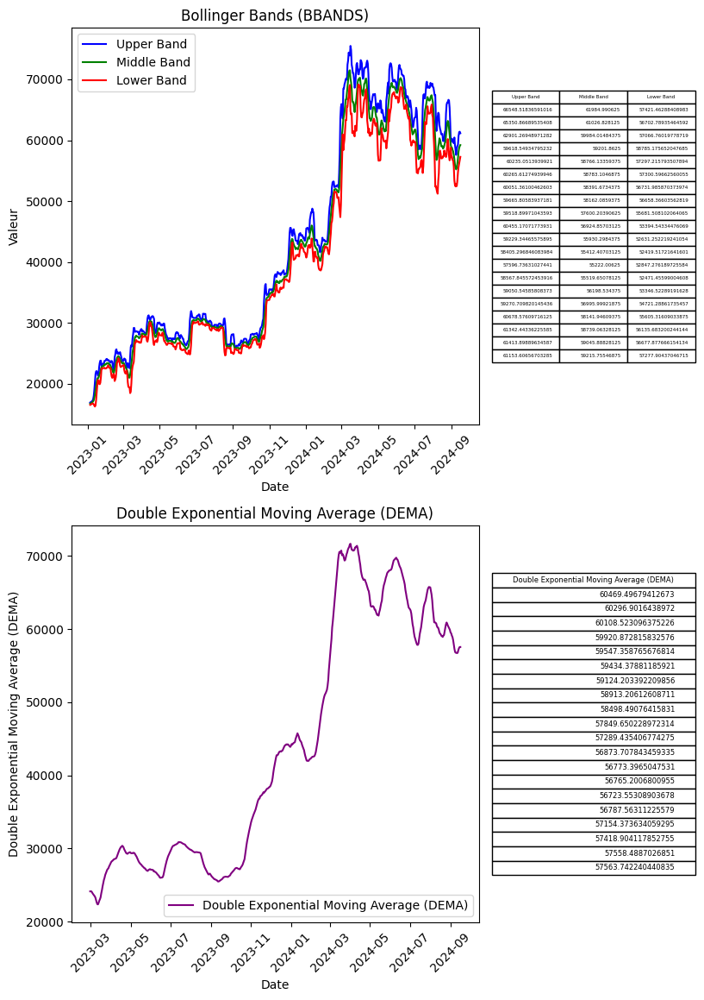

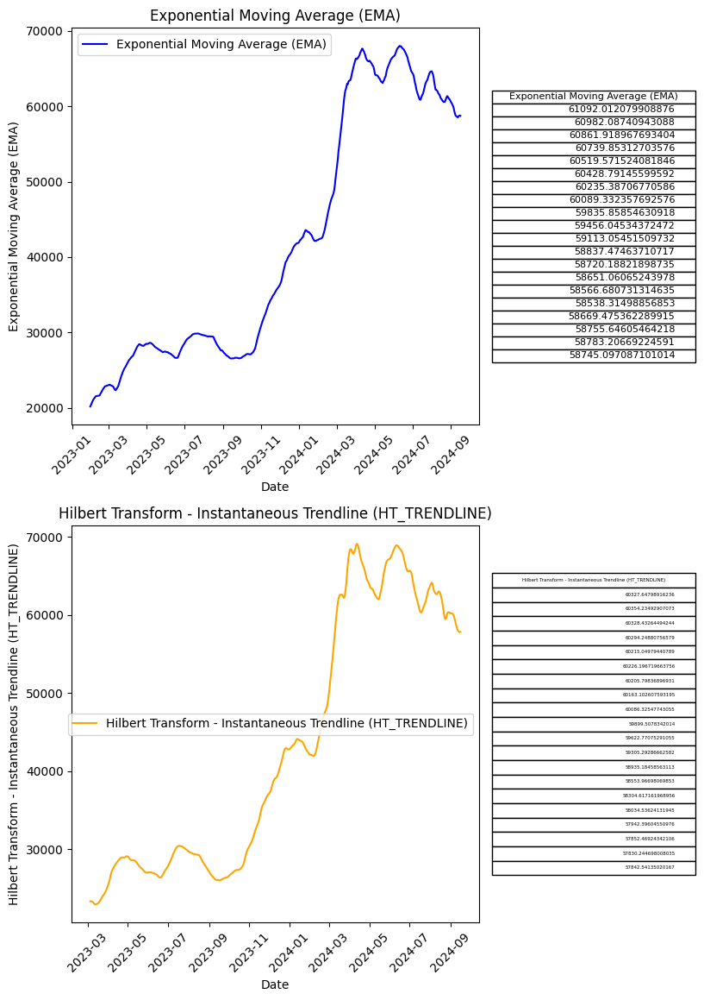

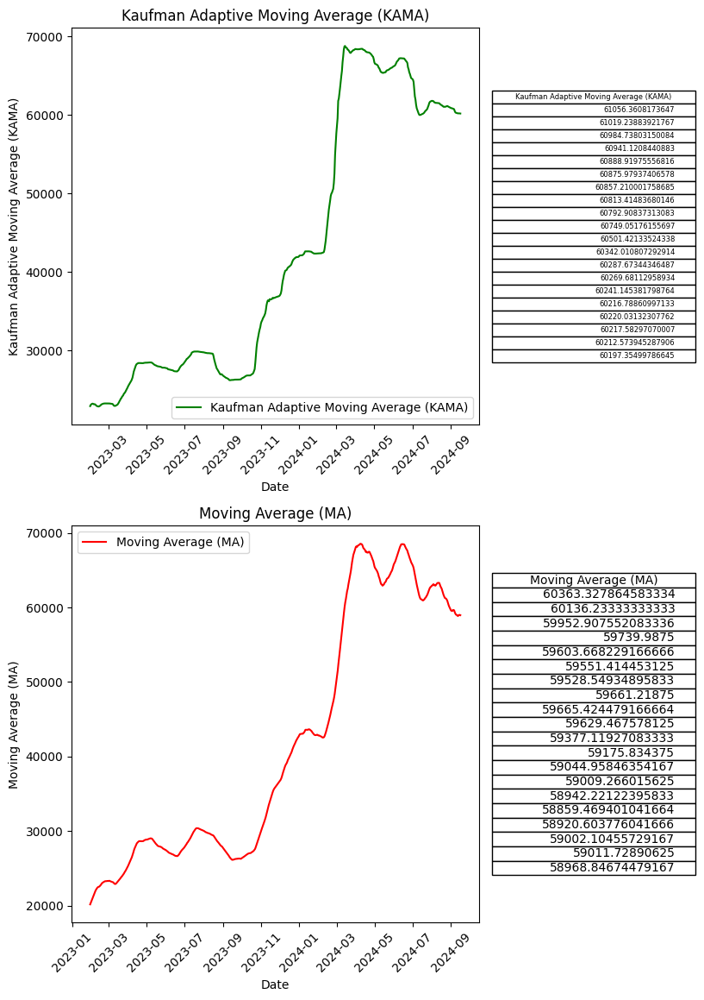

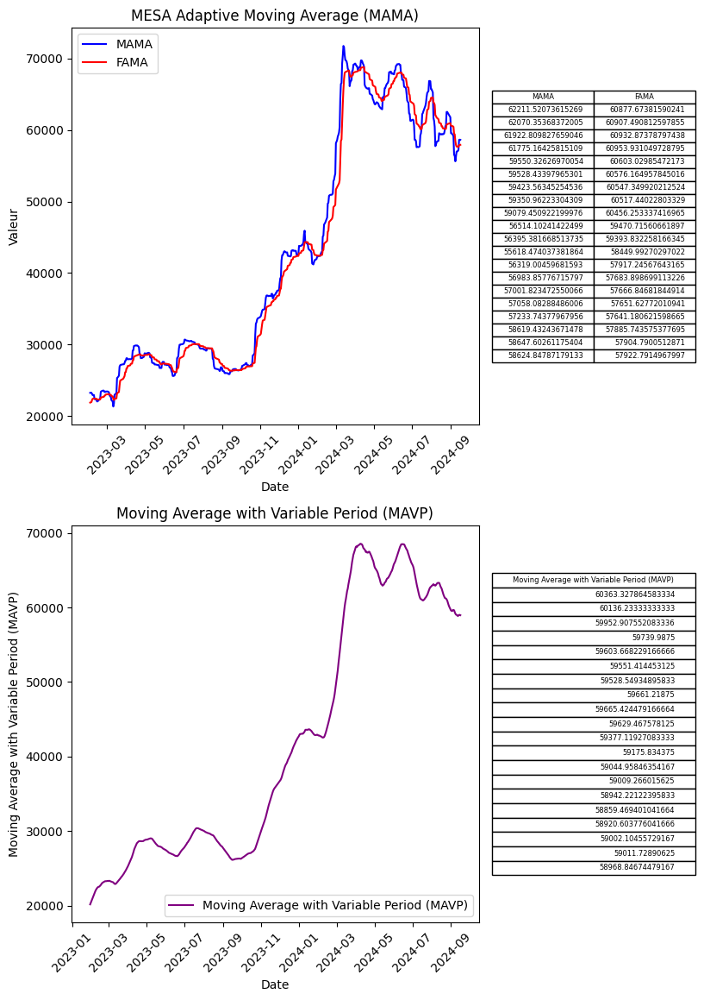

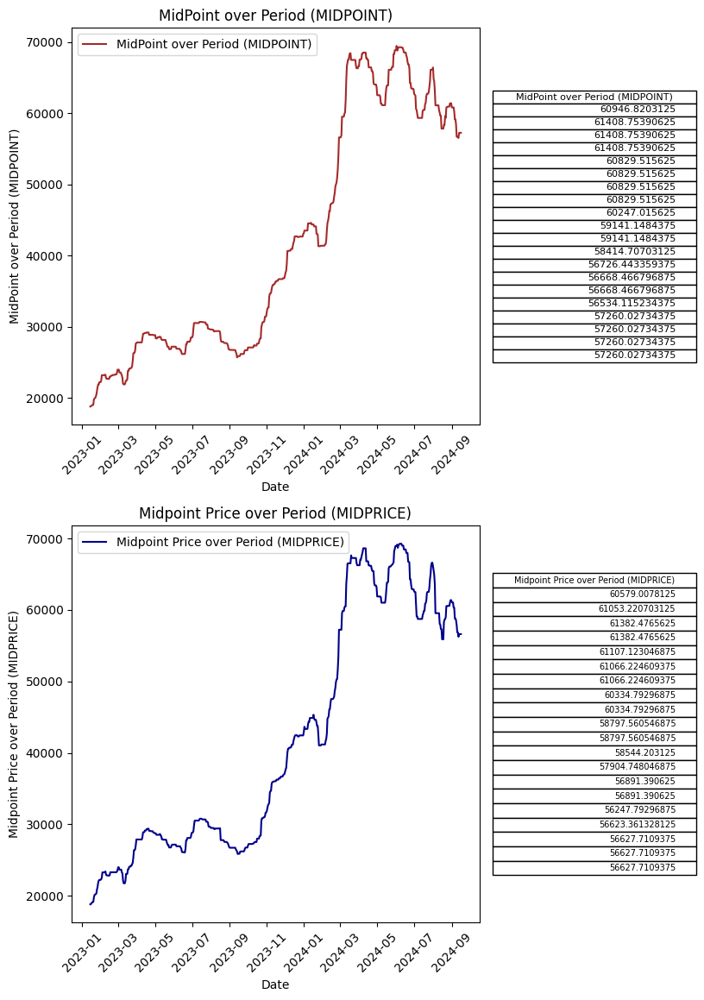

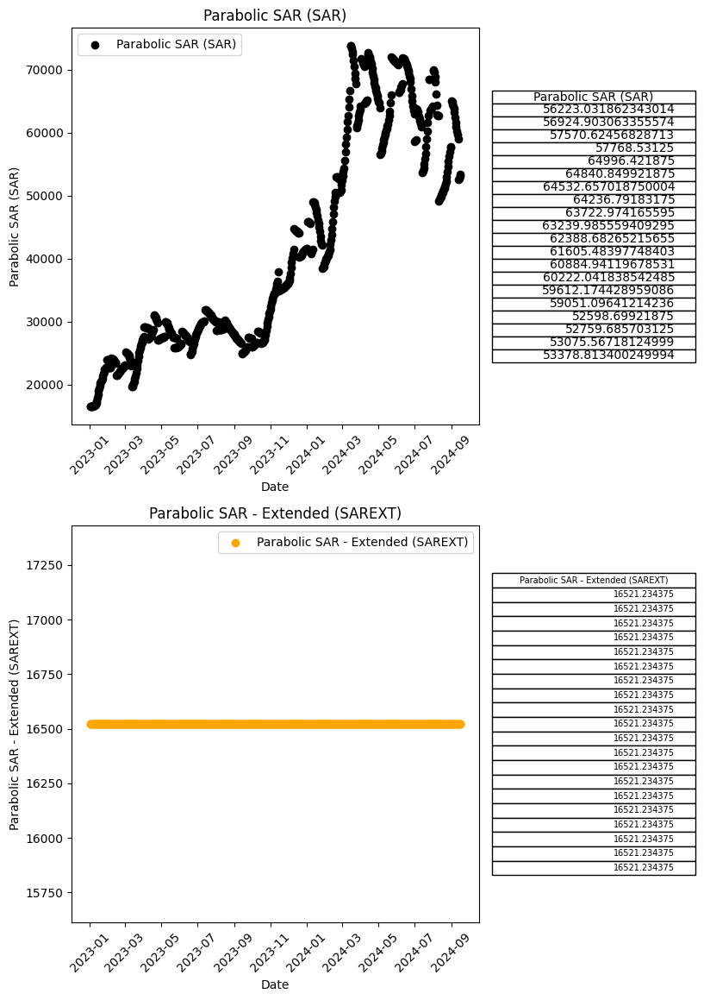

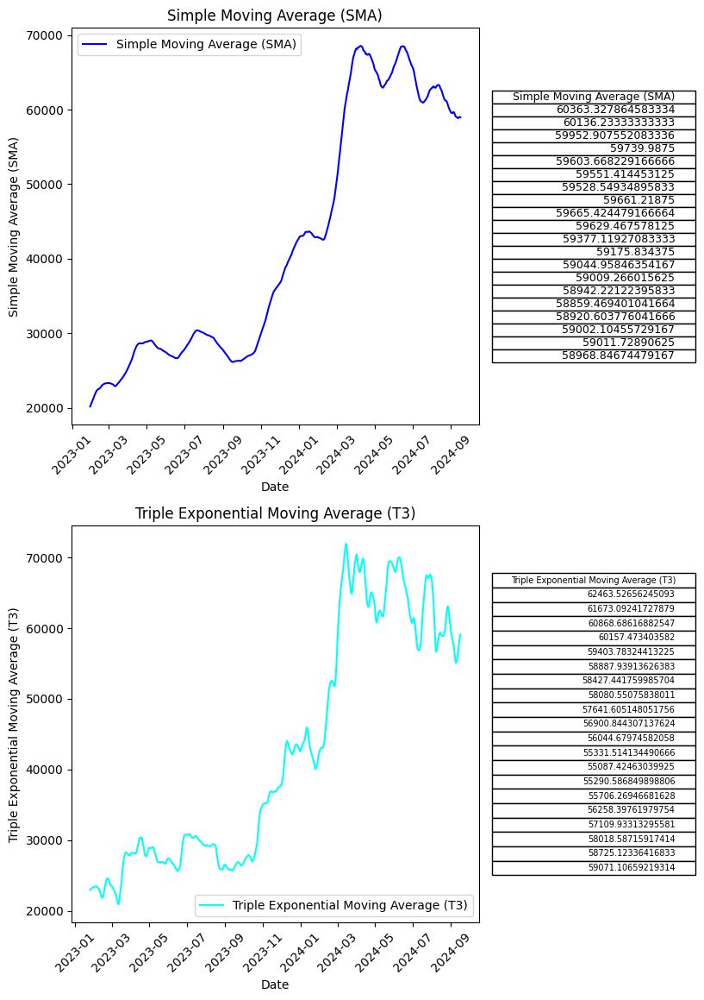

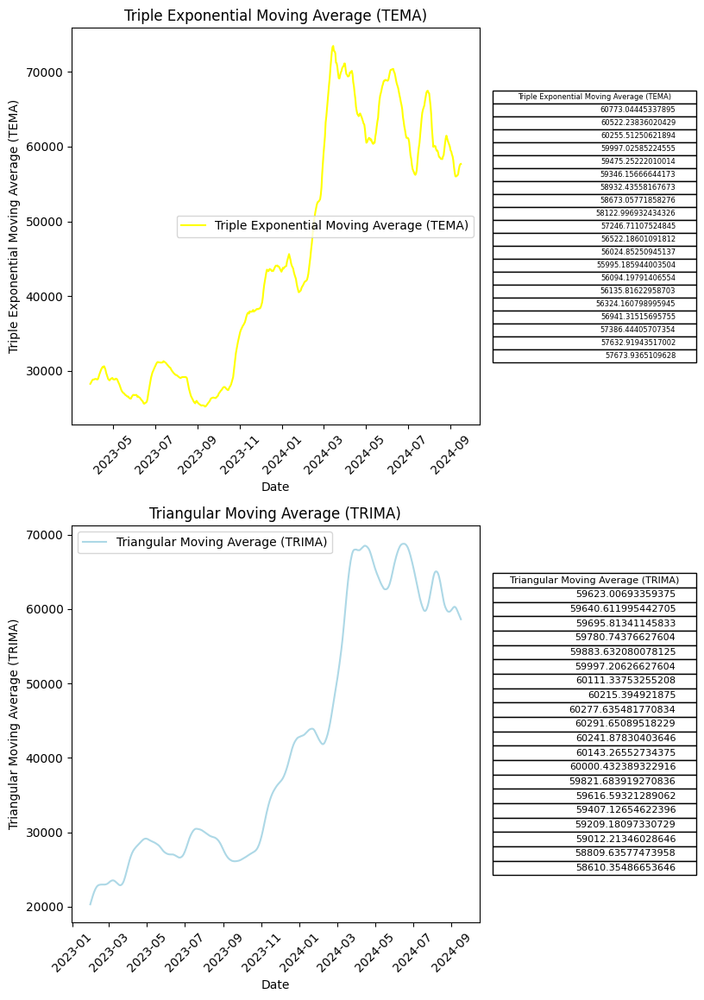

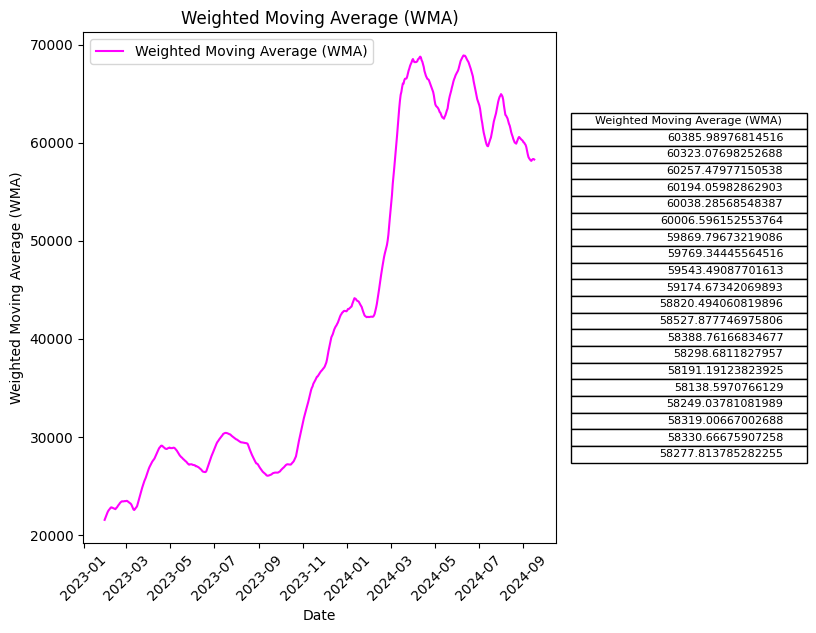

### Résumé des indicateurs de la catégorie: Overlap Studies

| Nom de l'indicateur | Description |
|---------------------|-------------|
| Bollinger Bands (BBANDS) | Bollinger Bands se compose de 3 bandes, définissant une zone de volatilité autour de la moyenne mobile. |
| Double Exponential Moving Average (DEMA) | La DEMA lisse les prix de manière plus rapide que la moyenne mobile simple. |
| Exponential Moving Average (EMA) | La moyenne mobile exponentielle donne plus de poids aux prix récents. |
| Hilbert Transform - Instantaneous Trendline (HT_TRENDLINE) | Hilbert Transform qui fournit une tendance instantanée. |
| Kaufman Adaptive Moving Average (KAMA) | La KAMA est une moyenne mobile adaptive conçue pour réagir rapidement aux mouvements de prix. |
| Moving Average (MA) | Moyenne mobile simple basée sur le prix moyen des périodes passées. |
| MESA Adaptive Moving Average (MAMA) | Une moyenne mobile adaptative basée sur le cycle du marché. |
| Moving Average with Variable Period (MAVP) | Une moyenne mobile où la période est variable. |
| MidPoint over Period (MIDPOINT) | Le point médian sur une période spécifiée. |
| Midpoint Price over Period (MIDPRICE) | Le prix médian basé sur les hauts et bas d'une période spécifiée. |
| Parabolic SAR (SAR) | Le Parabolic SAR identifie les inversions de tendance dans un marché. |
| Parabolic SAR - Extended (SAREXT) | Une version étendue du Parabolic SAR avec des réglages supplémentaires. |
| Simple Moving Average (SMA) | La moyenne mobile simple calcule la moyenne des prix sur une période donnée. |
| Triple Exponential Moving Average (T3) | Une moyenne mobile triplement exponentielle pour plus de réactivité. |
| Triple Exponential Moving Average (TEMA) | La TEMA est utilisée pour lisser les fluctuations du prix. |
| Triangular Moving Average (TRIMA) | La moyenne mobile triangulaire donne plus de poids aux prix au centre de la période. |
| Weighted Moving Average (WMA) | La moyenne mobile pondérée donne plus d'importance aux prix récents. |


## Momentum Indicator Functions

**Description de la catégorie:** Ces indicateurs mesurent la vitesse ou la force des mouvements des prix.

**Nombre d'indicateurs dans cette catégorie:** 23


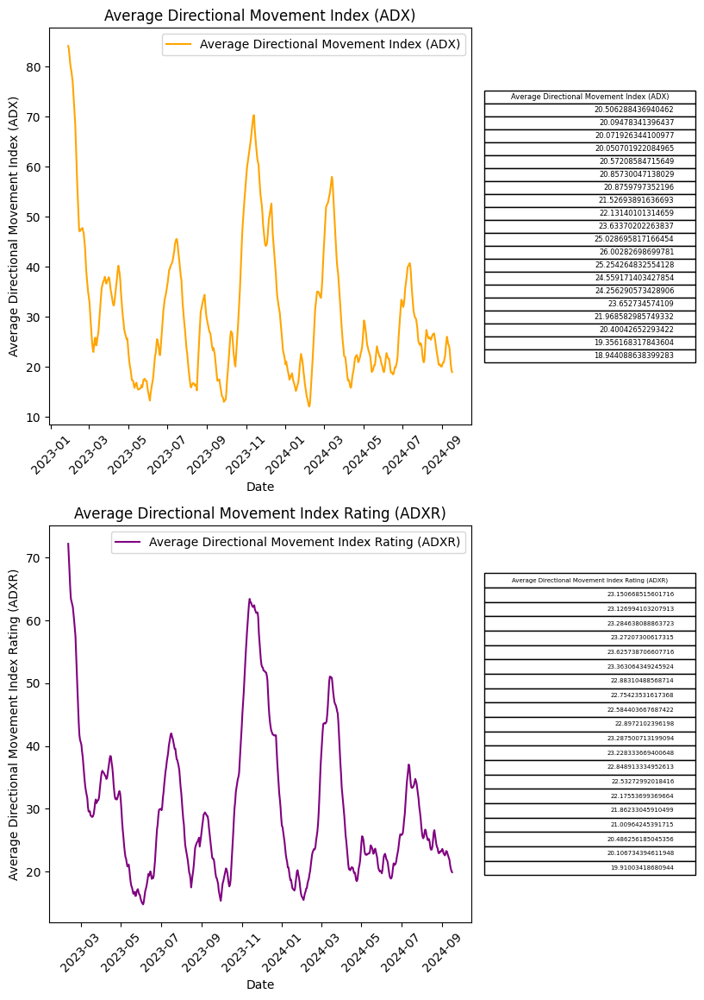

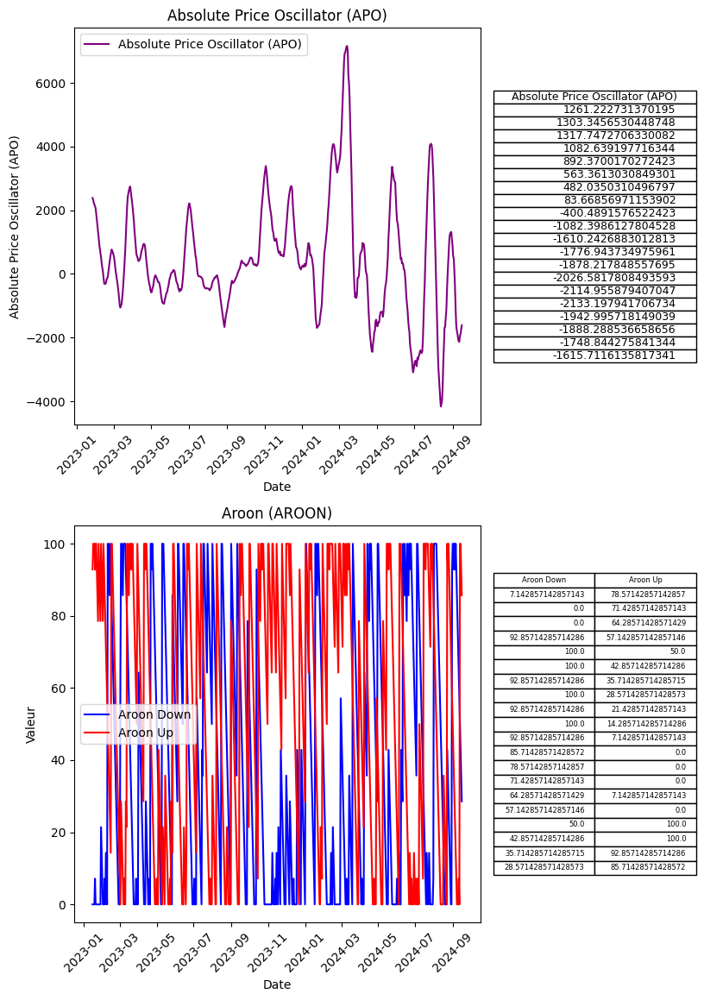

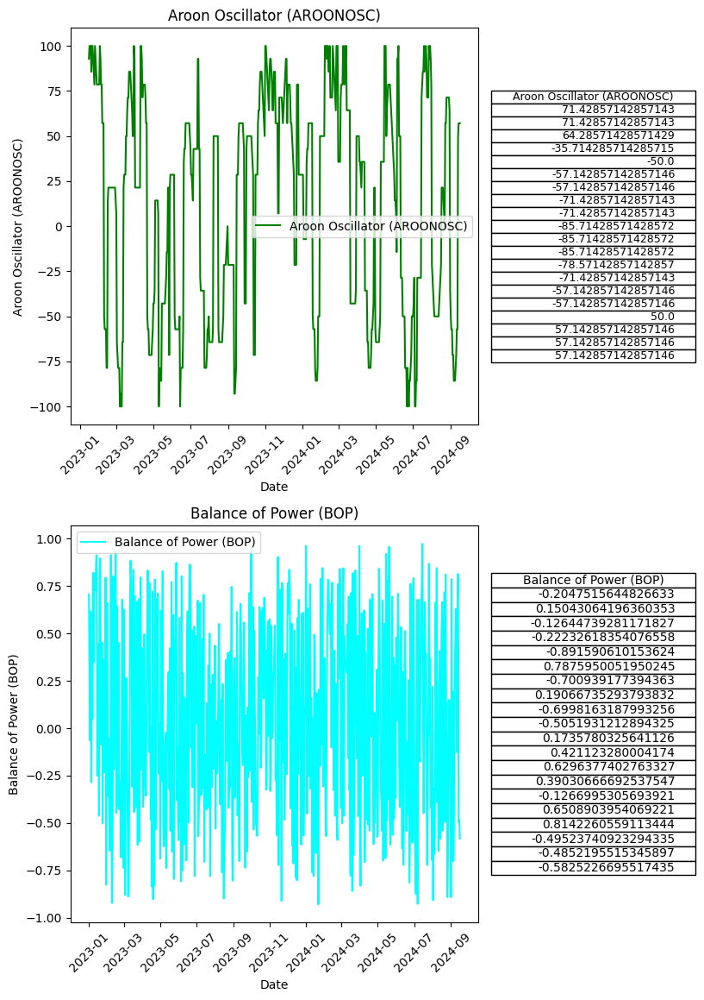

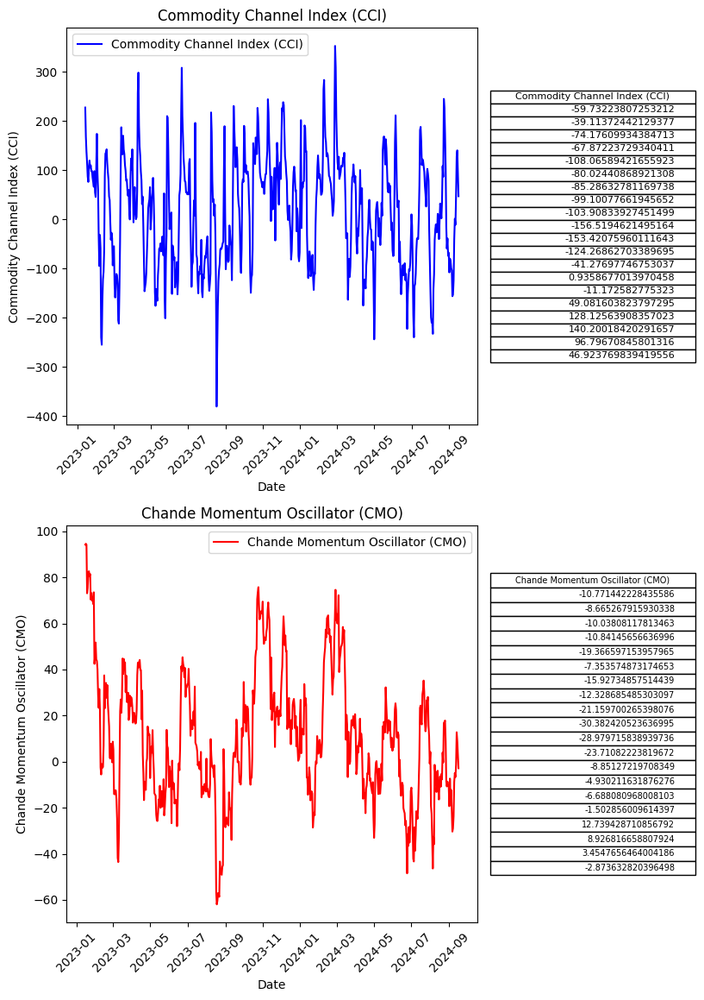

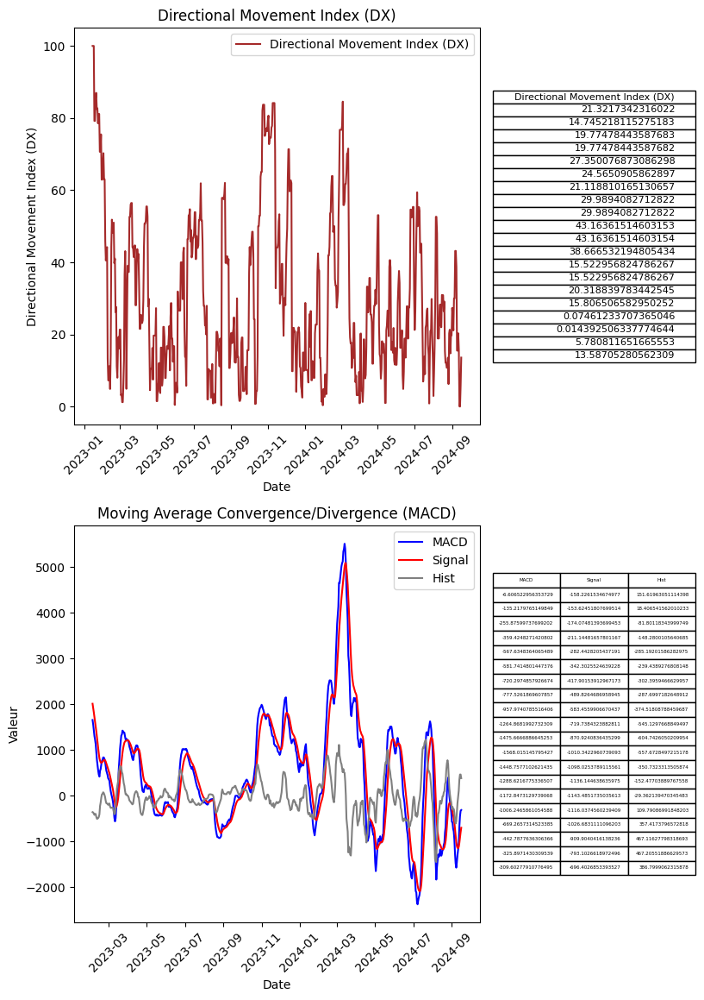

...

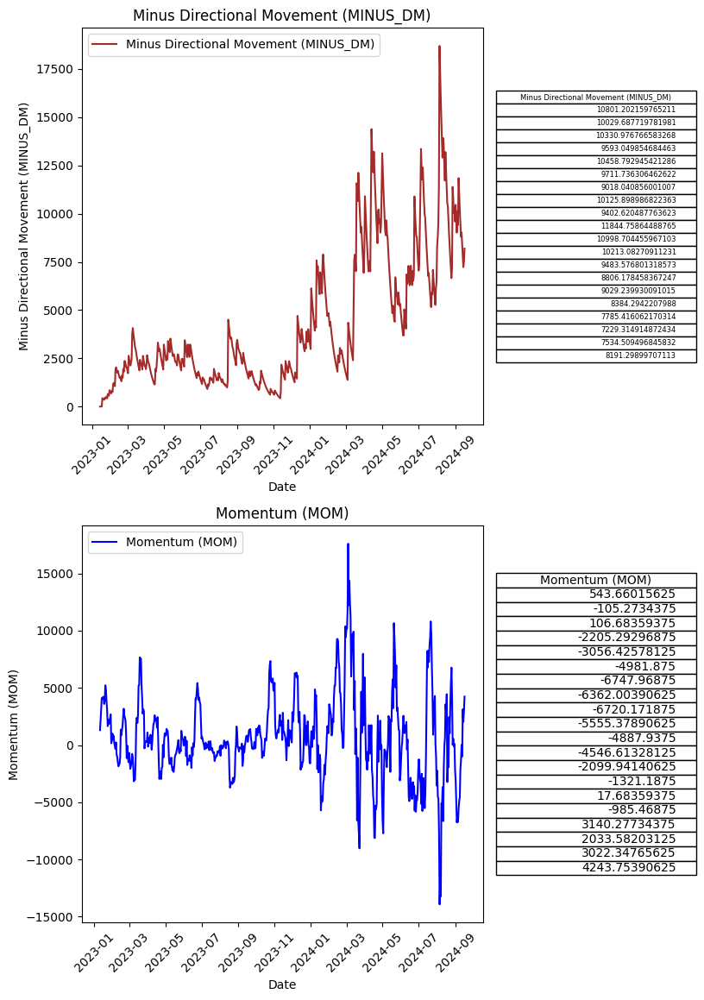

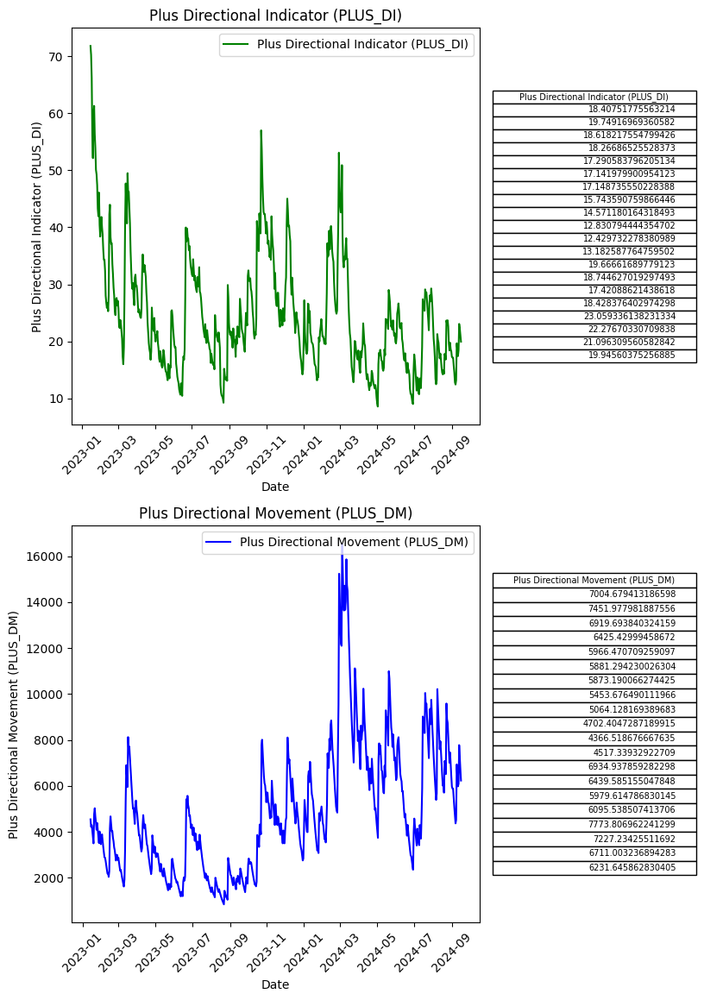

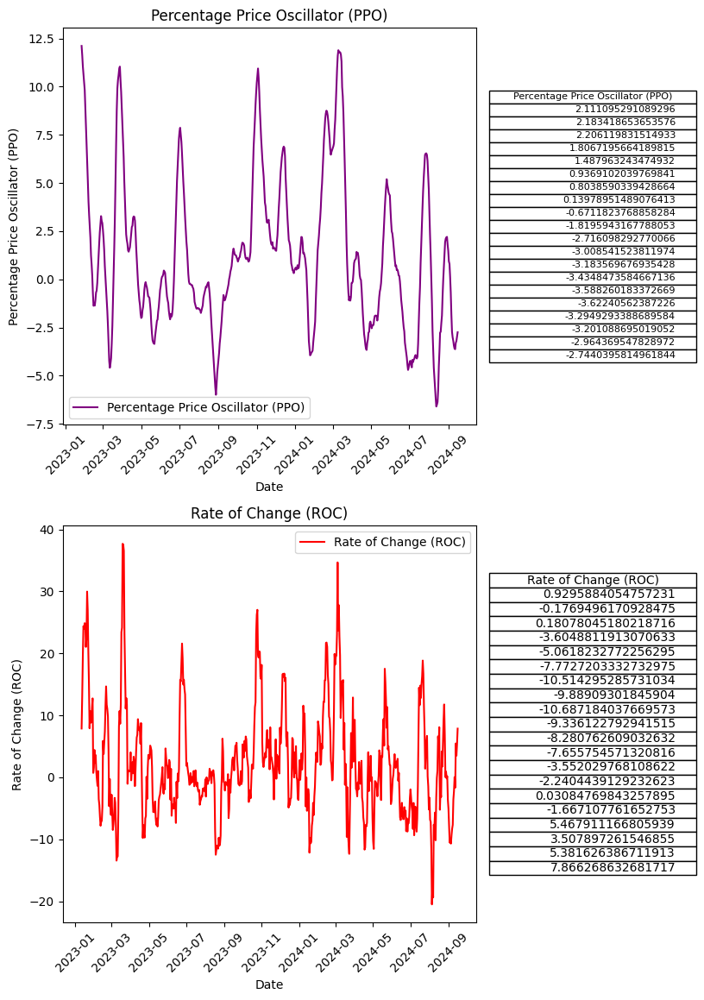

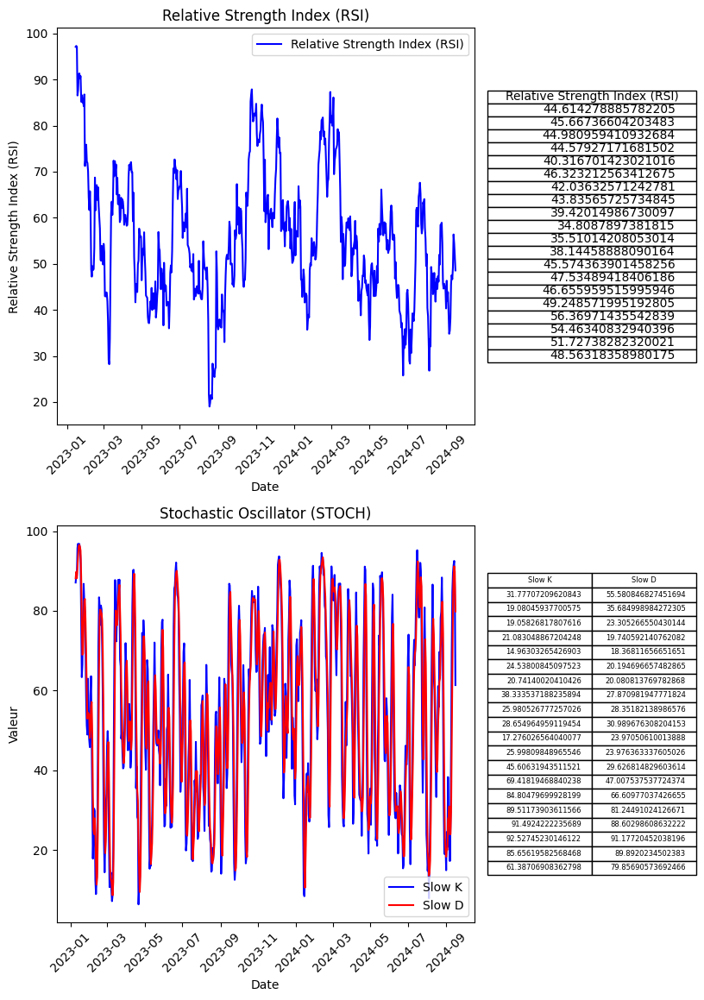

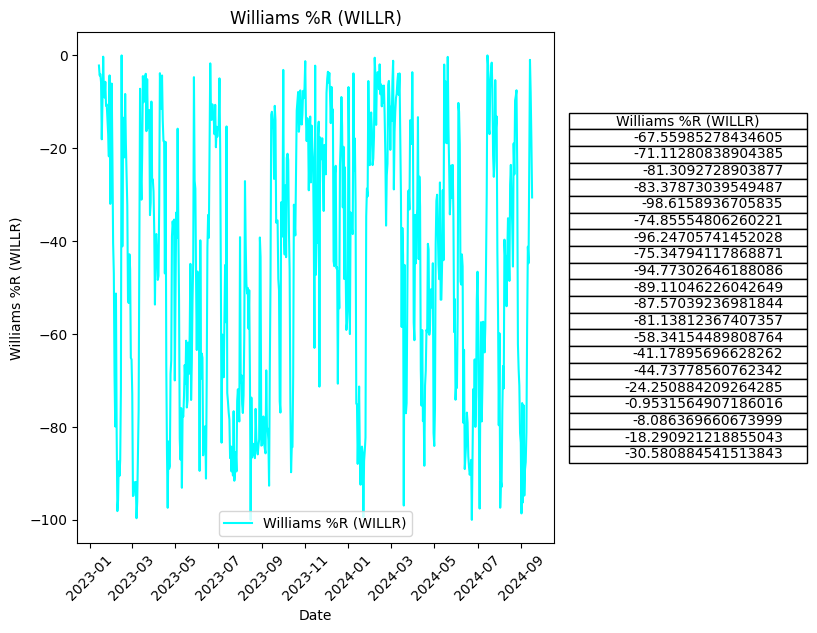

### Résumé des indicateurs de la catégorie: Momentum Indicator Functions

| Nom de l'indicateur | Description |
|---------------------|-------------|
| Average Directional Movement Index (ADX) | L'ADX mesure la force de la tendance. |
| Average Directional Movement Index Rating (ADXR) | L'ADXR est une version lissée de l'ADX. |
| Absolute Price Oscillator (APO) | Le différentiel entre deux moyennes mobiles pour indiquer la direction du prix. |
| Aroon (AROON) | Indicateur qui montre si une tendance est présente en comparant les hauts et les bas. |
| Aroon Oscillator (AROONOSC) | L'oscillateur Aroon montre la force relative d'une tendance. |
| Balance of Power (BOP) | L'équilibre des pouvoirs est un indicateur qui mesure la pression des acheteurs et des vendeurs. |
| Commodity Channel Index (CCI) | Mesure la déviation du prix par rapport à sa moyenne. |
| Chande Momentum Oscillator (CMO) | Le CMO mesure la vitesse du changement du prix. |
| Directional Movement Index (DX) | Indicateur qui mesure la force de la tendance. |
| Moving Average Convergence/Divergence (MACD) | Indicateur de momentum basé sur la différence entre deux moyennes mobiles. |
| MACD with controllable MA type (MACDEXT) | Une version du MACD avec des types de moyennes mobiles personnalisables. |
| MACD Fix 12/26 (MACDFIX) | MACD fixe avec des paramètres standards. |
| Money Flow Index (MFI) | Indicateur de momentum basé sur le volume et le prix. |
| Minus Directional Indicator (MINUS_DI) | Mesure la force de la pression vendeuse. |
| Minus Directional Movement (MINUS_DM) | Indicateur qui mesure les mouvements baissiers. |
| Momentum (MOM) | Mesure la vitesse du changement de prix. |
| Plus Directional Indicator (PLUS_DI) | Mesure la force de la pression acheteuse. |
| Plus Directional Movement (PLUS_DM) | Indicateur qui mesure les mouvements haussiers. |
| Percentage Price Oscillator (PPO) | Un oscillateur basé sur le prix qui exprime les changements en pourcentage. |
| Rate of Change (ROC) | Mesure le pourcentage de changement entre le prix actuel et un prix passé. |
| Relative Strength Index (RSI) | Indicateur de momentum populaire qui compare les gains récents aux pertes récentes. |
| Stochastic Oscillator (STOCH) | Indicateur de momentum qui compare le prix de clôture au range de prix sur une période donnée. |
| Williams %R (WILLR) | Mesure si le prix est proche des hauts ou des bas sur une période donnée. |


## Volume Indicator Functions

**Description de la catégorie:** Ces indicateurs utilisent le volume pour confirmer la tendance ou détecter les retournements.

**Nombre d'indicateurs dans cette catégorie:** 3


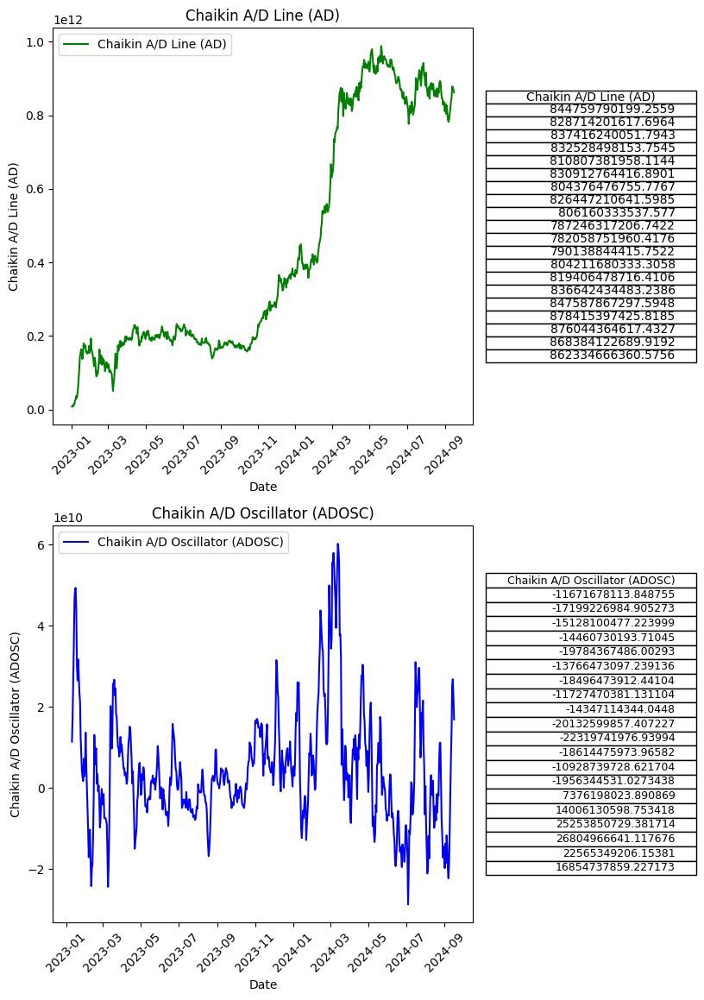

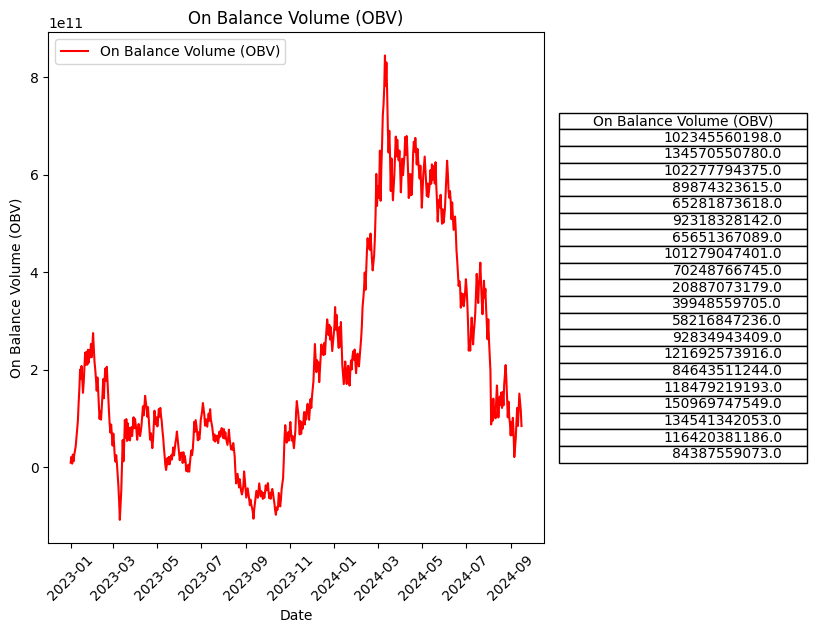

### Résumé des indicateurs de la catégorie: Volume Indicator Functions

| Nom de l'indicateur | Description |
|---------------------|-------------|
| Chaikin A/D Line (AD) | Indicateur cumulé du flux de volume, utilisé pour mesurer la pression acheteuse et vendeuse. |
| Chaikin A/D Oscillator (ADOSC) | Oscillateur qui mesure les flux de volume en fonction des mouvements de prix. |
| On Balance Volume (OBV) | Indicateur cumulatif basé sur le volume, montrant si le volume est entrant ou sortant du marché. |


## Volatility Indicator Functions

**Description de la catégorie:** Ces indicateurs mesurent la volatilité du marché en analysant les écarts de prix sur une période donnée.

**Nombre d'indicateurs dans cette catégorie:** 3


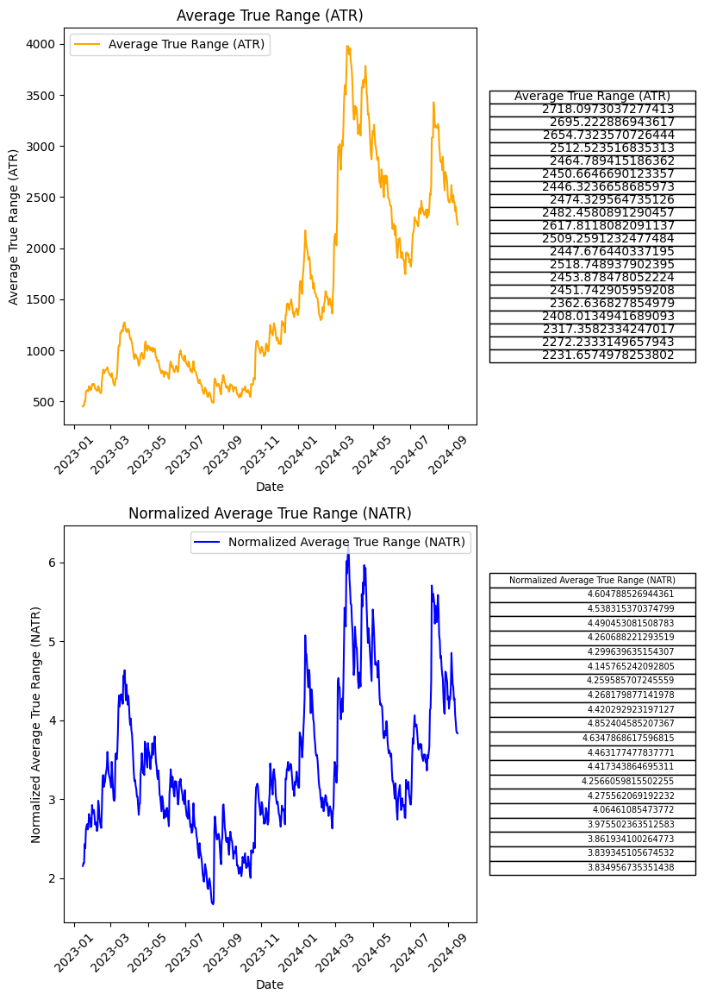

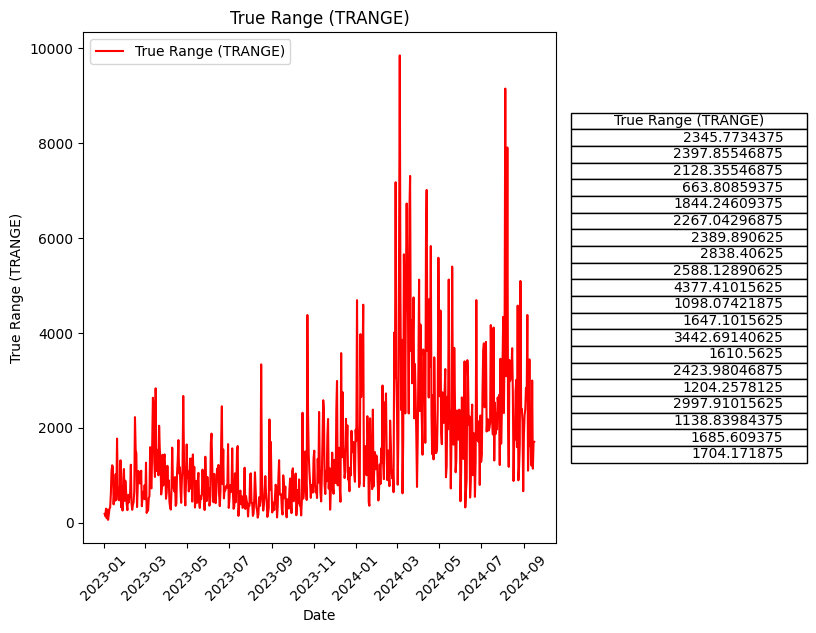

### Résumé des indicateurs de la catégorie: Volatility Indicator Functions

| Nom de l'indicateur | Description |
|---------------------|-------------|
| Average True Range (ATR) | Mesure de la volatilité moyenne sur une période donnée. |
| Normalized Average True Range (NATR) | Mesure la volatilité relative en fonction de la volatilité normalisée. |
| True Range (TRANGE) | Mesure la différence entre les hauts et les bas pour une période donnée. |


## Price Transform Functions

**Description de la catégorie:** Ces fonctions transforment les prix en moyennes ou valeurs représentatives pour une meilleure analyse.

**Nombre d'indicateurs dans cette catégorie:** 4


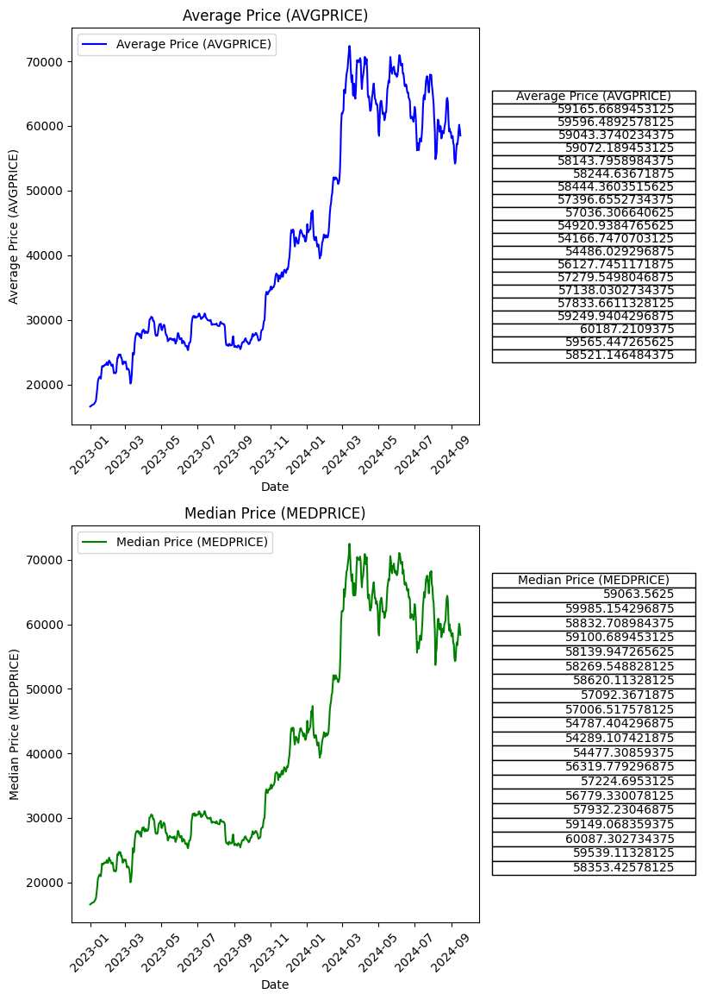

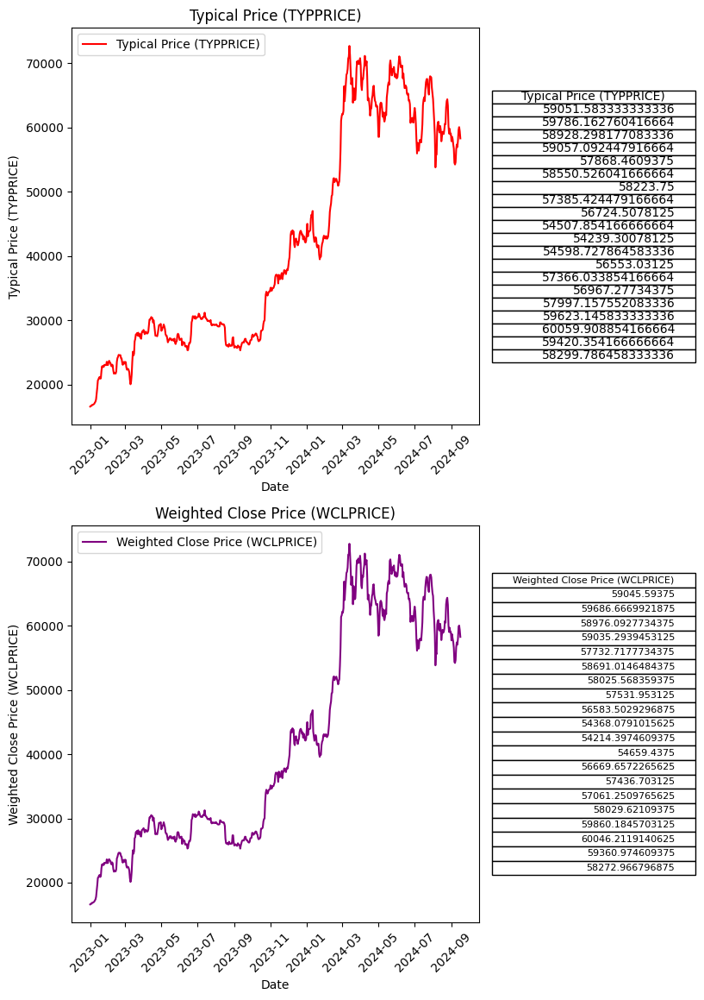

### Résumé des indicateurs de la catégorie: Price Transform Functions

| Nom de l'indicateur | Description |
|---------------------|-------------|
| Average Price (AVGPRICE) | Calcule le prix moyen basé sur les prix d'ouverture, le plus haut, le plus bas et la clôture. |
| Median Price (MEDPRICE) | Calcule le prix médian basé sur les prix les plus hauts et les plus bas. |
| Typical Price (TYPPRICE) | Calcule le prix typique basé sur le plus haut, le plus bas et le prix de clôture. |
| Weighted Close Price (WCLPRICE) | Calcule le prix de clôture pondéré basé sur les prix hauts, bas et de clôture. |


## Price Transform Functions

**Description de la catégorie:** Ces fonctions transforment les prix en moyennes ou valeurs représentatives pour une meilleure analyse.

**Nombre d'indicateurs dans cette catégorie:** 4


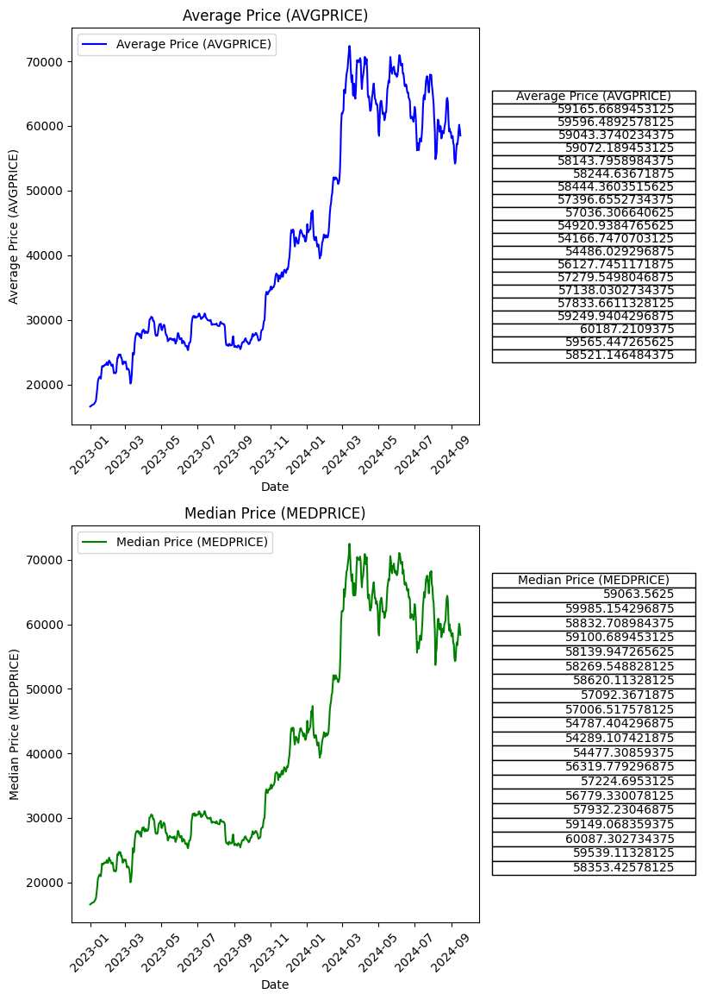

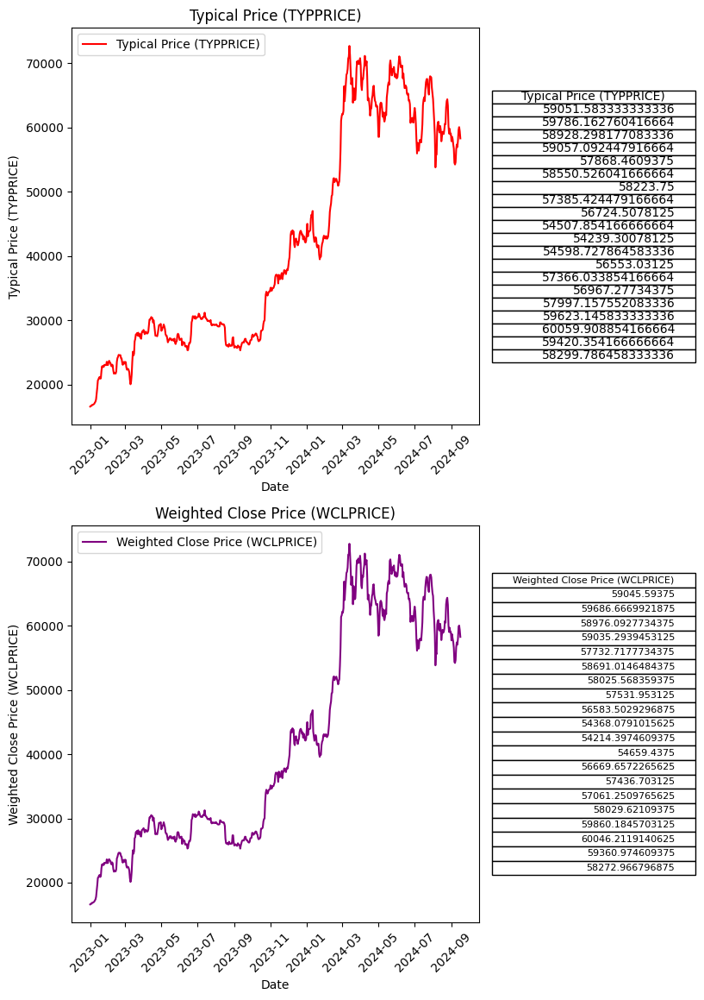

### Résumé des indicateurs de la catégorie: Price Transform Functions

| Nom de l'indicateur | Description |
|---------------------|-------------|
| Average Price (AVGPRICE) | Calcule le prix moyen basé sur les prix d'ouverture, le plus haut, le plus bas et la clôture. |
| Median Price (MEDPRICE) | Calcule le prix médian basé sur les prix les plus hauts et les plus bas. |
| Typical Price (TYPPRICE) | Calcule le prix typique basé sur le plus haut, le plus bas et le prix de clôture. |
| Weighted Close Price (WCLPRICE) | Calcule le prix de clôture pondéré basé sur les prix hauts, bas et de clôture. |


## Cycle Indicator Functions

**Description de la catégorie:** Ces fonctions utilisent la transformée de Hilbert pour analyser les cycles dominants dans les données de prix.

**Nombre d'indicateurs dans cette catégorie:** 5


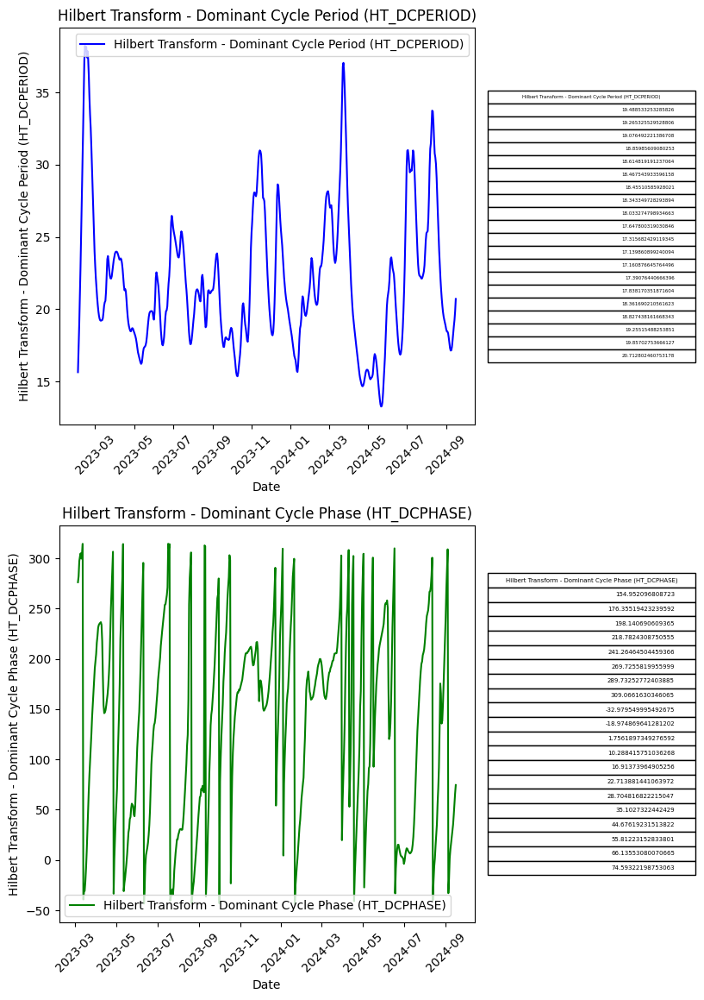

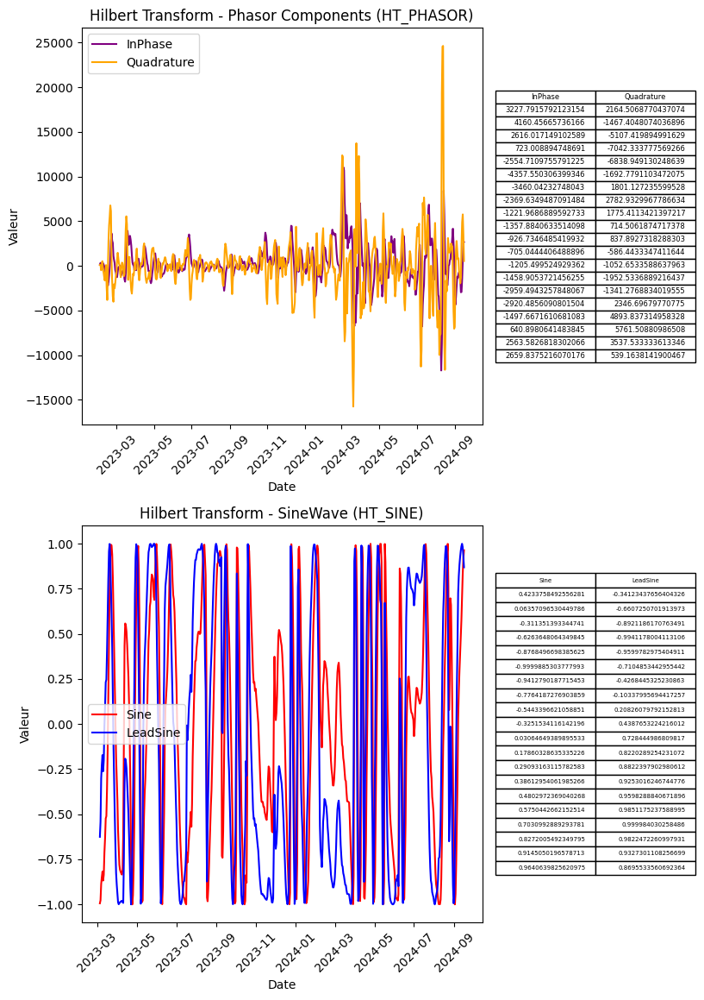

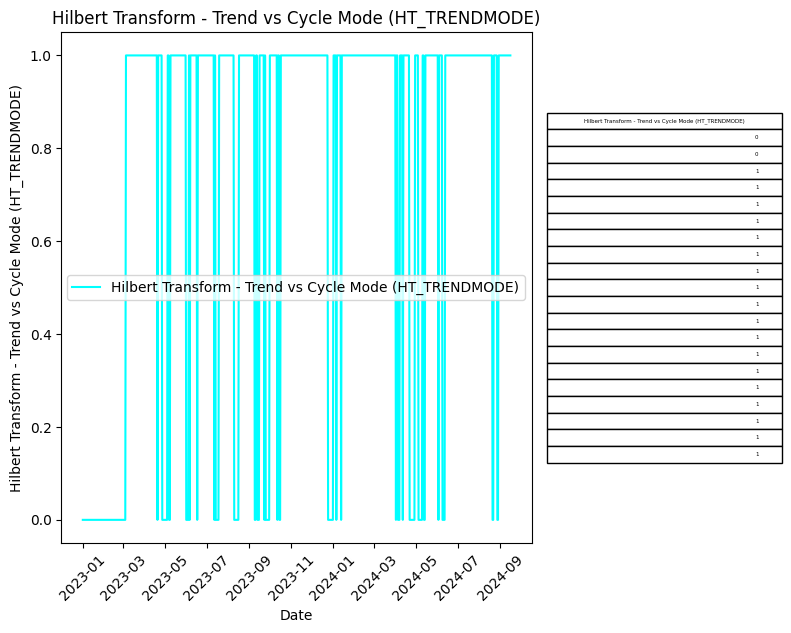

### Résumé des indicateurs de la catégorie: Cycle Indicator Functions

| Nom de l'indicateur | Description |
|---------------------|-------------|
| Hilbert Transform - Dominant Cycle Period (HT_DCPERIOD) | Calcule la période du cycle dominant à l'aide de la transformée de Hilbert. |
| Hilbert Transform - Dominant Cycle Phase (HT_DCPHASE) | Calcule la phase du cycle dominant à l'aide de la transformée de Hilbert. |
| Hilbert Transform - Phasor Components (HT_PHASOR) | Renvoie les composants du phasor à l'aide de la transformée de Hilbert. |
| Hilbert Transform - SineWave (HT_SINE) | Renvoie les valeurs de la sinusoïde et de son avance à l'aide de la transformée de Hilbert. |
| Hilbert Transform - Trend vs Cycle Mode (HT_TRENDMODE) | Indique si le marché est en mode tendance ou cycle en utilisant la transformée de Hilbert. |


In [21]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from IPython.display import display, Markdown
import numpy as np
import pandas as pd

def compute_and_plot_categories(data, categories):
    """
    Calcule et affiche les indicateurs techniques classés par catégorie avec 2 graphiques par page et des résumés indépendants.

    Parameters:
    - data (pd.DataFrame): DataFrame contenant les données boursières avec colonnes nécessaires.
    - categories (list): Liste de catégories, chacune contenant des indicateurs.
    """

    # Introduction générale du rapport
    display(Markdown("# Rapport Technique : Analyse des Indicateurs Financiers"))

    # Créer une copie du DataFrame pour éviter de modifier l'original
    data = data.copy()

    # Convertir les colonnes nécessaires en float64 une fois pour toutes
    cols_to_convert = set()
    for category in categories:
        for indicator in category['indicators']:
            args = indicator['args']
            cols_to_convert.update(args)
    for col in cols_to_convert:
        if col in data.columns:
            data[col] = data[col].astype('float64')

    # Dictionnaire pour stocker les nouvelles colonnes à ajouter au DataFrame
    new_columns_dict = {}

    for category in categories:
        category_name = category['name']
        category_description = category['description']
        indicators = category['indicators']
        num_indicators = len(indicators)

        # Afficher la description de la catégorie
        display(Markdown(f"## {category_name}\n\n"
                         f"**Description de la catégorie:** {category_description}\n\n"
                         f"**Nombre d'indicateurs dans cette catégorie:** {num_indicators}\n"))

        # Initialiser une liste pour le tableau résumé
        summary_table = []
        chart_count = 0

        for idx, indicator in enumerate(indicators):
            name = indicator['name']
            description = indicator.get('description', 'Aucune description disponible.')
            func = indicator['func']
            args = indicator['args']
            params = indicator.get('params', {})
            plot_params = indicator.get('plot_params', {})
            multiple = indicator.get('multiple', False)
            new_columns = indicator.get('new_columns', [])
            plot_type = plot_params.get('type', 'line')

            # Ajouter l'indicateur à la table récapitulative
            summary_table.append([name, description])

            try:
                # Préparer les arguments pour la fonction TA-Lib
                func_args = []
                for arg in args:
                    if arg in data.columns:
                        # Les colonnes sont déjà converties en float64
                        column_data = data[arg].values
                        func_args.append(column_data)
                    else:
                        raise ValueError(f"Colonne '{arg}' requise pour {name} non trouvée dans le DataFrame.")

                # Calculer l'indicateur
                result = func(*func_args, **params)

                # Tracer deux graphiques par page (verticalement) avec un tableau des 20 dernières lignes
                if chart_count % 2 == 0:
                    fig = plt.figure(figsize=(8.27, 11.69))  # Format A4 portrait
                    gs = GridSpec(2, 2, width_ratios=[2, 1], height_ratios=[1, 1])
                    current_ax = 0

                # Gérer les indicateurs avec plusieurs sorties (comme MACD, STOCH, etc.)
                if multiple:
                    if isinstance(result, tuple):
                        # Collecter les nouvelles colonnes dans un DataFrame temporaire
                        temp_df = pd.DataFrame(index=data.index)
                        for i, res in enumerate(result):
                            col_name = new_columns[i] if new_columns else f"{name}_{i}"
                            temp_df[col_name] = res
                        # Ajouter les nouvelles colonnes au dictionnaire
                        new_columns_dict.update(temp_df)

                        # Tracer chaque composant
                        ax1 = fig.add_subplot(gs[current_ax])
                        for i, res in enumerate(result):
                            col_name = new_columns[i] if new_columns else f"{name}_{i}"
                            color = plot_params.get('colors', ['blue', 'red', 'gray'])[i] if 'colors' in plot_params else 'blue'
                            if plot_type == 'line':
                                ax1.plot(data.index, res, label=col_name, color=color)
                            elif plot_type == 'scatter':
                                ax1.scatter(data.index, res, label=col_name, color=color)

                        ax1.set_title(f"{name}")
                        ax1.set_xlabel('Date')
                        ax1.set_ylabel('Valeur')
                        ax1.legend()
                        ax1.tick_params(axis='x', rotation=45)
                        plt.tight_layout()

                        # Prévisualisation des 20 dernières lignes
                        ax2 = fig.add_subplot(gs[current_ax + 1])
                        table_data = temp_df.tail(20)
                        ax2.axis('off')
                        ax2.table(cellText=table_data.values, colLabels=table_data.columns, loc='center')

                    else:
                        raise ValueError(f"L'indicateur {name} est marqué comme multiple mais ne retourne pas un tuple.")
                else:
                    # Ajouter l'indicateur au dictionnaire des nouvelles colonnes
                    new_columns_dict[name] = result

                    # Tracer l'indicateur
                    ax1 = fig.add_subplot(gs[current_ax])
                    color = plot_params.get('color', 'blue')
                    if plot_type == 'line':
                        ax1.plot(data.index, result, label=name, color=color)
                    elif plot_type == 'scatter':
                        ax1.scatter(data.index, result, label=name, color=color)

                    ax1.set_title(f"{name}")
                    ax1.set_xlabel('Date')
                    ax1.set_ylabel(name)
                    ax1.legend()
                    ax1.tick_params(axis='x', rotation=45)
                    plt.tight_layout()

                    # Prévisualisation des 20 dernières lignes
                    ax2 = fig.add_subplot(gs[current_ax + 1])
                    table_data = pd.DataFrame({name: result}).tail(20)
                    ax2.axis('off')
                    ax2.table(cellText=table_data.values, colLabels=table_data.columns, loc='center')

                # Passer au prochain graphique (verticalement)
                chart_count += 1
                current_ax += 2

                # Afficher les graphiques après chaque paire d'indicateurs
                if chart_count % 2 == 0 or idx == len(indicators) - 1:
                    plt.show()

            except Exception as e:
                print(f"Erreur lors du calcul ou du traçage de l'indicateur {name}: {e}")

        # Après avoir traité tous les indicateurs de la catégorie, ajouter les nouvelles colonnes au DataFrame
        if new_columns_dict:
            # Convertir le dictionnaire en DataFrame
            new_columns_df = pd.DataFrame(new_columns_dict, index=data.index)
            # Concaténer avec le DataFrame data
            data = pd.concat([data, new_columns_df], axis=1)
            # Réinitialiser le dictionnaire pour la prochaine catégorie
            new_columns_dict = {}

        # Générer la table récapitulative proprement en Markdown
        table_markdown = f"### Résumé des indicateurs de la catégorie: {category_name}\n\n"
        table_markdown += "| Nom de l'indicateur | Description |\n"
        table_markdown += "|---------------------|-------------|\n"
        for row in summary_table:
            table_markdown += f"| {row[0]} | {row[1]} |\n"

        # Afficher la table récapitulative
        display(Markdown(table_markdown))

    # À la fin, vous pouvez retourner le DataFrame data si nécessaire
    return data

# Appel de la fonction avec les données et les catégories
data = compute_and_plot_categories(data, categories)


In [22]:
# Import des bibliothèques nécessaires
import talib
import yfinance as yf

# Récupération des données pour les patterns
data = yf.download('BTC-USD', start='2023-01-01', end='2024-09-17')

# Resetting the index to turn the Date index into a column
data.reset_index(inplace=True)

# Now you can access the 'Date' column along with others
data = data[['Date', 'Open', 'High', 'Low', 'Close']].dropna().copy()


[*********************100%***********************]  1 of 1 completed


In [23]:
# Définir les fonctions de reconnaissance de patterns
patterns = [
    {'name': 'Two Crows (CDL2CROWS)', 'description': 'Configuration baissière après une tendance haussière.', 'func': talib.CDL2CROWS},
    {'name': 'Three Black Crows (CDL3BLACKCROWS)', 'description': 'Inversion baissière après une tendance haussière.', 'func': talib.CDL3BLACKCROWS},
    {'name': 'Three Inside Up/Down (CDL3INSIDE)', 'description': 'Inversion haussière ou baissière.', 'func': talib.CDL3INSIDE},
    {'name': 'Three-Line Strike (CDL3LINESTRIKE)', 'description': 'Inversion après trois bougies alignées.', 'func': talib.CDL3LINESTRIKE},
    {'name': 'Three Outside Up/Down (CDL3OUTSIDE)', 'description': 'Inversion haussière ou baissière.', 'func': talib.CDL3OUTSIDE},
    {'name': 'Three Stars In The South (CDL3STARSINSOUTH)', 'description': 'Pattern haussier.', 'func': talib.CDL3STARSINSOUTH},
    {'name': 'Three Advancing White Soldiers (CDL3WHITESOLDIERS)', 'description': 'Pattern haussier fort.', 'func': talib.CDL3WHITESOLDIERS},
    {'name': 'Abandoned Baby (CDLABANDONEDBABY)', 'description': 'Inversion après un gap.', 'func': talib.CDLABANDONEDBABY},
    {'name': 'Advance Block (CDLADVANCEBLOCK)', 'description': 'Indique une faiblesse haussière.', 'func': talib.CDLADVANCEBLOCK},
    {'name': 'Belt-hold (CDLBELTHOLD)', 'description': 'Pattern de continuation haussier ou baissier.', 'func': talib.CDLBELTHOLD},
    {'name': 'Breakaway (CDLBREAKAWAY)', 'description': 'Pattern de renversement après une forte tendance.', 'func': talib.CDLBREAKAWAY},
    {'name': 'Closing Marubozu (CDLCLOSINGMARUBOZU)', 'description': 'Indique la domination d’un côté du marché.', 'func': talib.CDLCLOSINGMARUBOZU},
    {'name': 'Concealing Baby Swallow (CDLCONCEALBABYSWALL)', 'description': 'Pattern baissier.', 'func': talib.CDLCONCEALBABYSWALL},
    {'name': 'Counterattack (CDLCOUNTERATTACK)', 'description': 'Pattern de renversement haussier ou baissier.', 'func': talib.CDLCOUNTERATTACK},
    {'name': 'Dark Cloud Cover (CDLDARKCLOUDCOVER)', 'description': 'Inversion baissière.', 'func': talib.CDLDARKCLOUDCOVER},
    {'name': 'Doji (CDLDOJI)', 'description': 'Indécision dans le marché.', 'func': talib.CDLDOJI},
    {'name': 'Doji Star (CDLDOJISTAR)', 'description': 'Pattern d’inversion haussier ou baissier.', 'func': talib.CDLDOJISTAR},
    {'name': 'Dragonfly Doji (CDLDRAGONFLYDOJI)', 'description': 'Indique un potentiel retournement haussier.', 'func': talib.CDLDRAGONFLYDOJI},
    {'name': 'Engulfing Pattern (CDLENGULFING)', 'description': 'Pattern de renversement haussier ou baissier.', 'func': talib.CDLENGULFING},
    {'name': 'Evening Doji Star (CDLEVENINGDOJISTAR)', 'description': 'Inversion baissière.', 'func': talib.CDLEVENINGDOJISTAR},
    {'name': 'Evening Star (CDLEVENINGSTAR)', 'description': 'Inversion baissière après une tendance haussière.', 'func': talib.CDLEVENINGSTAR},
    {'name': 'Up/Down-gap side-by-side white lines (CDLGAPSIDESIDEWHITE)', 'description': 'Continuation de tendance.', 'func': talib.CDLGAPSIDESIDEWHITE},
    {'name': 'Gravestone Doji (CDLGRAVESTONEDOJI)', 'description': 'Indique un potentiel retournement baissier.', 'func': talib.CDLGRAVESTONEDOJI},
    {'name': 'Hammer (CDLHAMMER)', 'description': 'Indique un retournement haussier.', 'func': talib.CDLHAMMER},
    {'name': 'Hanging Man (CDLHANGINGMAN)', 'description': 'Inversion baissière.', 'func': talib.CDLHANGINGMAN},
    {'name': 'Harami Pattern (CDLHARAMI)', 'description': 'Pattern de renversement.', 'func': talib.CDLHARAMI},
    {'name': 'Harami Cross Pattern (CDLHARAMICROSS)', 'description': 'Inversion haussière ou baissière.', 'func': talib.CDLHARAMICROSS},
    {'name': 'High-Wave Candle (CDLHIGHWAVE)', 'description': 'Indécision sur le marché.', 'func': talib.CDLHIGHWAVE},
    {'name': 'Hikkake Pattern (CDLHIKKAKE)', 'description': 'Pattern de continuation ou de renversement.', 'func': talib.CDLHIKKAKE},
    {'name': 'Modified Hikkake Pattern (CDLHIKKAKEMOD)', 'description': 'Variation du Hikkake.', 'func': talib.CDLHIKKAKEMOD},
    {'name': 'Homing Pigeon (CDLHOMINGPIGEON)', 'description': 'Inversion haussière.', 'func': talib.CDLHOMINGPIGEON},
    {'name': 'Identical Three Crows (CDLIDENTICAL3CROWS)', 'description': 'Inversion baissière.', 'func': talib.CDLIDENTICAL3CROWS},
    {'name': 'In-Neck Pattern (CDLINNECK)', 'description': 'Continuation baissière.', 'func': talib.CDLINNECK},
    {'name': 'Inverted Hammer (CDLINVERTEDHAMMER)', 'description': 'Inversion haussière.', 'func': talib.CDLINVERTEDHAMMER},
    {'name': 'Kicking (CDLKICKING)', 'description': 'Pattern de renversement haussier ou baissier.', 'func': talib.CDLKICKING},
    {'name': 'Kicking by Length (CDLKICKINGBYLENGTH)', 'description': 'Renversement basé sur la longueur des marubozus.', 'func': talib.CDLKICKINGBYLENGTH},
    {'name': 'Ladder Bottom (CDLLADDERBOTTOM)', 'description': 'Inversion haussière.', 'func': talib.CDLLADDERBOTTOM},
    {'name': 'Long Legged Doji (CDLLONGLEGGEDDOJI)', 'description': 'Indécision, possible retournement.', 'func': talib.CDLLONGLEGGEDDOJI},
    {'name': 'Long Line Candle (CDLLONGLINE)', 'description': 'Bougie à longue distance entre l’ouverture et la clôture.', 'func': talib.CDLLONGLINE},
    {'name': 'Marubozu (CDLMARUBOZU)', 'description': 'Bougie sans mèche, indique une forte direction.', 'func': talib.CDLMARUBOZU},
    {'name': 'Matching Low (CDLMATCHINGLOW)', 'description': 'Inversion haussière.', 'func': talib.CDLMATCHINGLOW},
    {'name': 'Mat Hold (CDLMATHOLD)', 'description': 'Continuation de tendance haussière ou baissière.', 'func': talib.CDLMATHOLD},
    {'name': 'Morning Doji Star (CDLMORNINGDOJISTAR)', 'description': 'Inversion haussière.', 'func': talib.CDLMORNINGDOJISTAR},
    {'name': 'Morning Star (CDLMORNINGSTAR)', 'description': 'Inversion haussière après une tendance baissière.', 'func': talib.CDLMORNINGSTAR},
    {'name': 'On-Neck Pattern (CDLONNECK)', 'description': 'Continuation baissière.', 'func': talib.CDLONNECK},
    {'name': 'Piercing Pattern (CDLPIERCING)', 'description': 'Inversion haussière.', 'func': talib.CDLPIERCING},
    {'name': 'Rickshaw Man (CDLRICKSHAWMAN)', 'description': 'Indique une indécision.', 'func': talib.CDLRICKSHAWMAN},
    {'name': 'Rising/Falling Three Methods (CDLRISEFALL3METHODS)', 'description': 'Pattern de continuation.', 'func': talib.CDLRISEFALL3METHODS},
    {'name': 'Separating Lines (CDLSEPARATINGLINES)', 'description': 'Continuation de tendance.', 'func': talib.CDLSEPARATINGLINES},
    {'name': 'Shooting Star (CDLSHOOTINGSTAR)', 'description': 'Inversion baissière.', 'func': talib.CDLSHOOTINGSTAR},
    {'name': 'Short Line Candle (CDLSHORTLINE)', 'description': 'Bougie avec une petite différence entre ouverture et clôture.', 'func': talib.CDLSHORTLINE},
    {'name': 'Spinning Top (CDLSPINNINGTOP)', 'description': 'Indique une indécision.', 'func': talib.CDLSPINNINGTOP},
    {'name': 'Stalled Pattern (CDLSTALLEDPATTERN)', 'description': 'Inversion de tendance haussière.', 'func': talib.CDLSTALLEDPATTERN},
    {'name': 'Stick Sandwich (CDLSTICKSANDWICH)', 'description': 'Inversion haussière.', 'func': talib.CDLSTICKSANDWICH},
    {'name': 'Takuri (CDLTAKURI)', 'description': 'Doji avec longue ombre inférieure, retournement haussier.', 'func': talib.CDLTAKURI},
    {'name': 'Tasuki Gap (CDLTASUKIGAP)', 'description': 'Pattern de continuation.', 'func': talib.CDLTASUKIGAP},
    {'name': 'Thrusting Pattern (CDLTHRUSTING)', 'description': 'Inversion haussière.', 'func': talib.CDLTHRUSTING},
    {'name': 'Tristar Pattern (CDLTRISTAR)', 'description': 'Inversion haussière ou baissière.', 'func': talib.CDLTRISTAR},
    {'name': 'Unique 3 River (CDLUNIQUE3RIVER)', 'description': 'Inversion haussière.', 'func': talib.CDLUNIQUE3RIVER},
    {'name': 'Upside Gap Two Crows (CDLUPSIDEGAP2CROWS)', 'description': 'Inversion baissière.', 'func': talib.CDLUPSIDEGAP2CROWS},
    {'name': 'Upside/Downside Gap Three Methods (CDLXSIDEGAP3METHODS)', 'description': 'Pattern de continuation.', 'func': talib.CDLXSIDEGAP3METHODS}
]


In [24]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.gridspec import GridSpec
from mplfinance.original_flavor import candlestick_ohlc
from IPython.display import display, Markdown
import pandas as pd

In [25]:
def plot_candlestick_with_signals(data, pattern_name, buy_signals, sell_signals):
    """
    Affiche les bougies japonaises avec les signaux d'achat et de vente.

    Parameters:
    - data (pd.DataFrame): Données OHLC avec colonnes Date, Open, High, Low, Close.
    - pattern_name (str): Nom du pattern de chandeliers japonais.
    - buy_signals (pd.DataFrame): Signaux d'achat avec colonnes Date et Close.
    - sell_signals (pd.DataFrame): Signaux de vente avec colonnes Date et Close.
    """
    fig = plt.figure(figsize=(8.27, 11.69))  # Format A4 portrait
    gs = GridSpec(2, 2, width_ratios=[2, 1], height_ratios=[1, 1])

    # Tracer les bougies japonaises à gauche
    ax1 = fig.add_subplot(gs[0, 0])
    ohlc = data[['Date', 'Open', 'High', 'Low', 'Close']].copy()

    ohlc['Date'] = mdates.date2num(ohlc['Date'])
    candlestick_ohlc(ax1, ohlc.values, width=0.6, colorup='green', colordown='red')

    # Tracer les signaux d'achat
    if not buy_signals.empty:
        ax1.scatter(buy_signals['Date'], buy_signals['Close'], color='green', marker='^', s=100, label='Achat')

    # Tracer les signaux de vente
    if not sell_signals.empty:
        ax1.scatter(sell_signals['Date'], sell_signals['Close'], color='red', marker='v', s=100, label='Vente')

    # Limiter le nombre de ticks sur l'axe des x
    ax1.xaxis.set_major_locator(mdates.AutoDateLocator())
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax1.tick_params(axis='x', rotation=45)
    ax1.grid(True)

    # Titre et légende
    ax1.set_title(f'Bougies Japonaises avec {pattern_name}')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Prix')
    ax1.legend()

    # Affichage des signaux dans table_data à droite
    ax2 = fig.add_subplot(gs[0, 1])

    # Collecter les DataFrames de signaux non vides
    signals_data_list = []

    # Ajouter les signaux d'achat s'ils ne sont pas vides
    if not buy_signals.empty:
        buy_signals = buy_signals.copy()
        buy_signals['Signal'] = 'Buy'
        buy_signals = buy_signals.dropna(subset=['Date', 'Close'])
        if not buy_signals.empty:
            signals_data_list.append(buy_signals[['Date', 'Close', 'Signal']])

    # Ajouter les signaux de vente s'ils ne sont pas vides
    if not sell_signals.empty:
        sell_signals = sell_signals.copy()
        sell_signals['Signal'] = 'Sell'
        sell_signals = sell_signals.dropna(subset=['Date', 'Close'])
        if not sell_signals.empty:
            signals_data_list.append(sell_signals[['Date', 'Close', 'Signal']])

    # Concaténer les DataFrames de signaux s'il y en a
    if signals_data_list:
        signals_data = pd.concat(signals_data_list, ignore_index=True)
        # Garder uniquement les 20 derniers signaux
        signals_data = signals_data.tail(20)
        ax2.axis('off')
        ax2.table(cellText=signals_data.values, colLabels=signals_data.columns, loc='center')
    else:
        ax2.axis('off')
        ax2.text(0.5, 0.5, "Aucun signal disponible", ha='center', va='center', fontsize=12)

    plt.tight_layout()
    plt.show()


Nombre de patterns : 61


### Two Crows (CDL2CROWS)

**Description:** Configuration baissière après une tendance haussière.


Aucun pattern Two Crows (CDL2CROWS) détecté dans les données.


### Three Black Crows (CDL3BLACKCROWS)

**Description:** Inversion baissière après une tendance haussière.


Aucun pattern Three Black Crows (CDL3BLACKCROWS) détecté dans les données.


### Three Inside Up/Down (CDL3INSIDE)

**Description:** Inversion haussière ou baissière.


Pattern détecté pour Three Inside Up/Down (CDL3INSIDE) aux dates suivantes :
     Three Inside Up/Down (CDL3INSIDE)
39                                -100
263                               -100
443                               -100


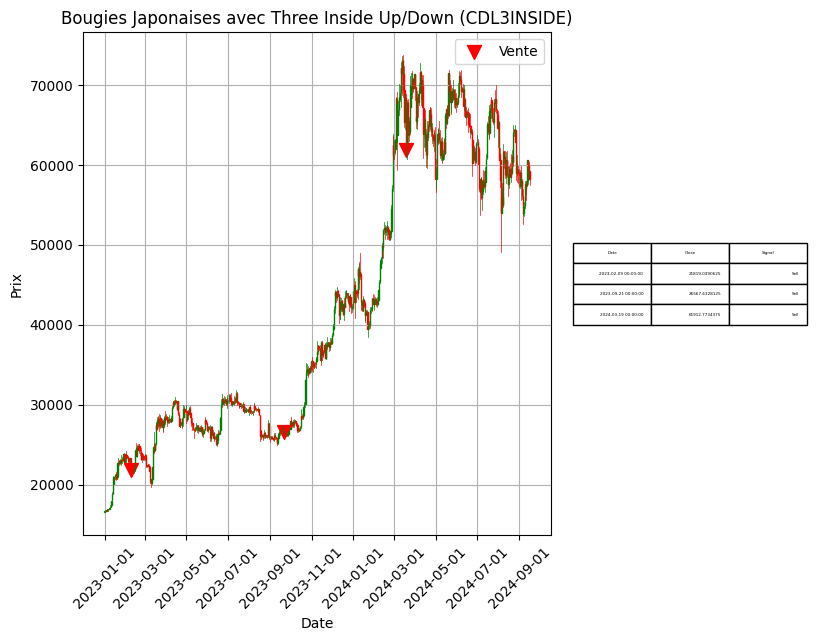

### Three-Line Strike (CDL3LINESTRIKE)

**Description:** Inversion après trois bougies alignées.


Pattern détecté pour Three-Line Strike (CDL3LINESTRIKE) aux dates suivantes :
     Three-Line Strike (CDL3LINESTRIKE)
218                                -100
249                                -100


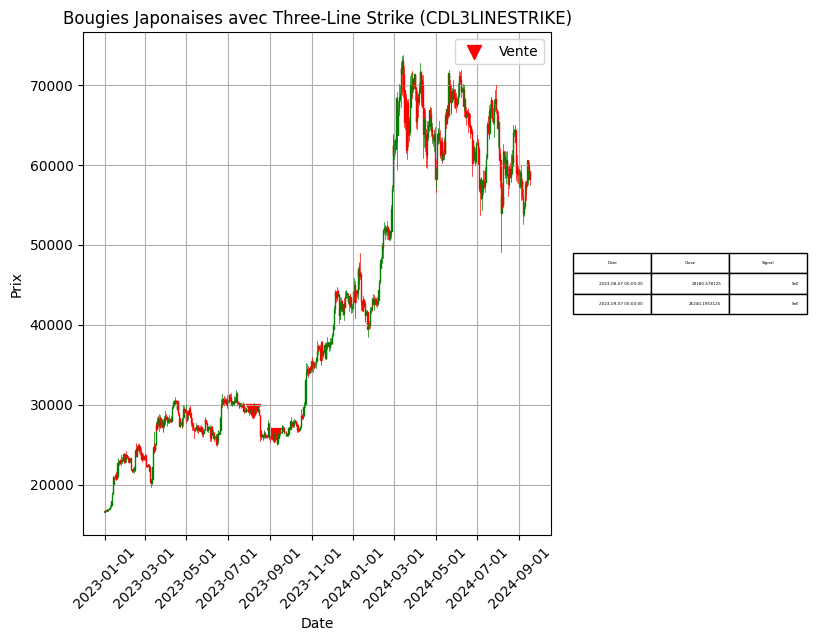

### Three Outside Up/Down (CDL3OUTSIDE)

**Description:** Inversion haussière ou baissière.


Pattern détecté pour Three Outside Up/Down (CDL3OUTSIDE) aux dates suivantes :
     Three Outside Up/Down (CDL3OUTSIDE)
482                                 -100
492                                 -100
530                                 -100
559                                  100
566                                  100
576                                 -100
592                                 -100
601                                  100
604                                 -100
614                                 -100


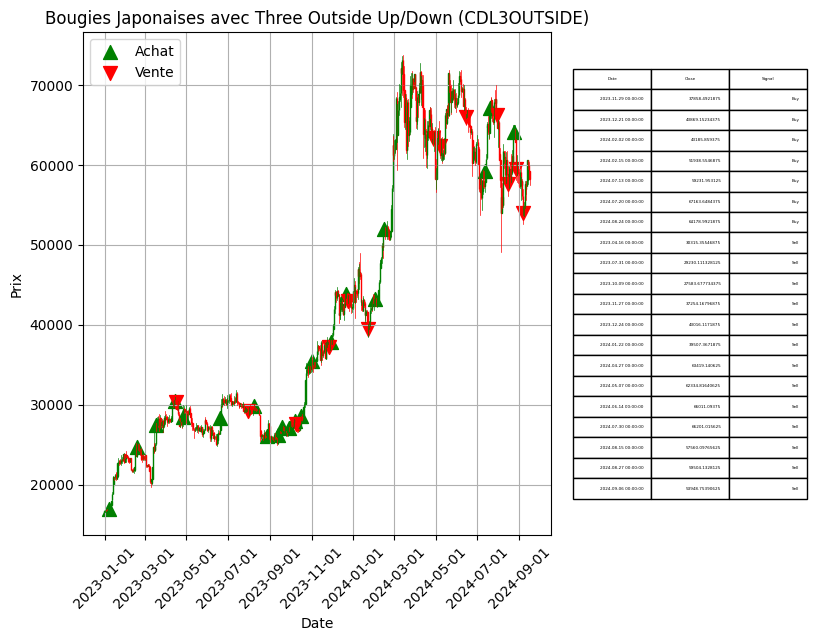

### Three Stars In The South (CDL3STARSINSOUTH)

**Description:** Pattern haussier.


Aucun pattern Three Stars In The South (CDL3STARSINSOUTH) détecté dans les données.


### Three Advancing White Soldiers (CDL3WHITESOLDIERS)

**Description:** Pattern haussier fort.


Aucun pattern Three Advancing White Soldiers (CDL3WHITESOLDIERS) détecté dans les données.


### Abandoned Baby (CDLABANDONEDBABY)

**Description:** Inversion après un gap.


Aucun pattern Abandoned Baby (CDLABANDONEDBABY) détecté dans les données.


### Advance Block (CDLADVANCEBLOCK)

**Description:** Indique une faiblesse haussière.


Pattern détecté pour Advance Block (CDLADVANCEBLOCK) aux dates suivantes :
     Advance Block (CDLADVANCEBLOCK)
72                              -100
100                             -100
257                             -100
293                             -100
405                             -100
411                             -100
450                             -100
490                             -100
562                             -100


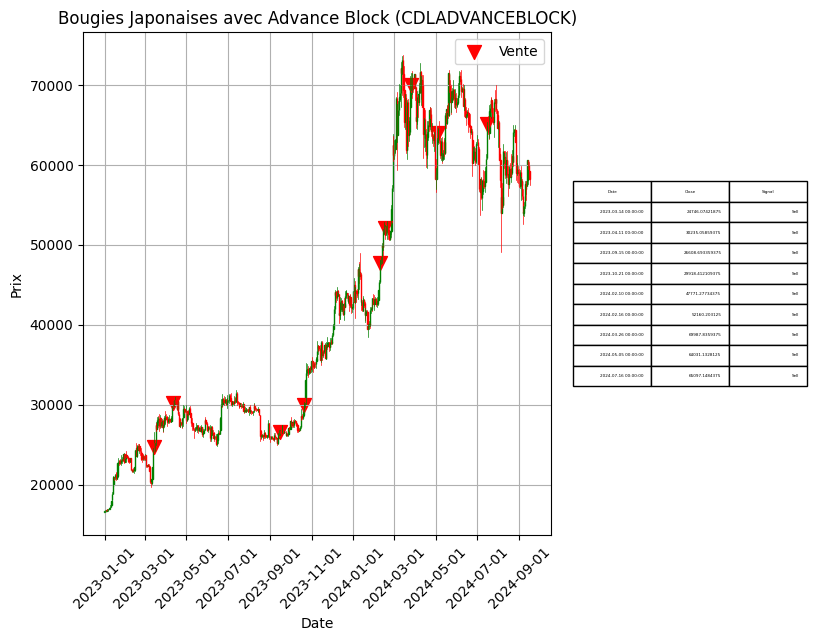

### Belt-hold (CDLBELTHOLD)

**Description:** Pattern de continuation haussier ou baissier.


Pattern détecté pour Belt-hold (CDLBELTHOLD) aux dates suivantes :
     Belt-hold (CDLBELTHOLD)
572                      100
579                     -100
582                     -100
583                      100
585                      100
598                      100
600                      100
603                     -100
609                     -100
610                      100


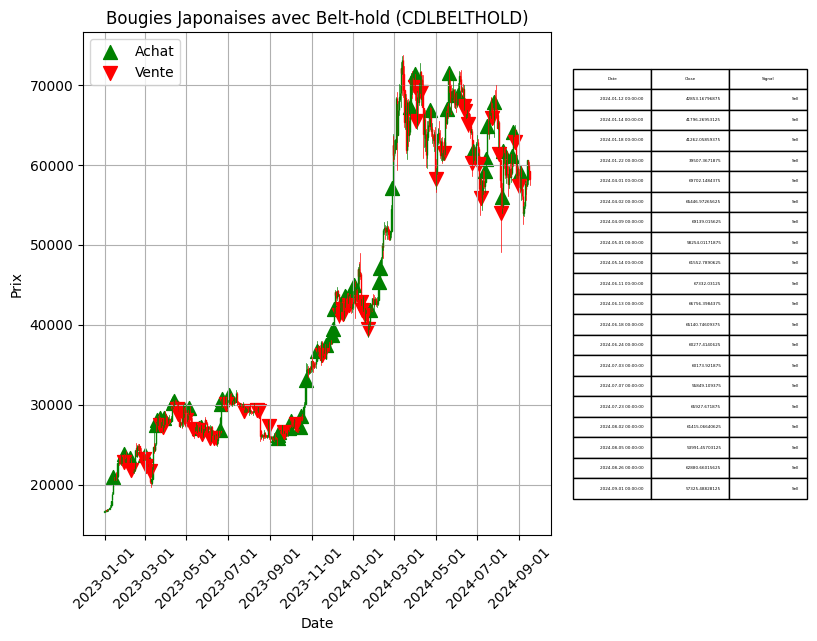

### Breakaway (CDLBREAKAWAY)

**Description:** Pattern de renversement après une forte tendance.


Aucun pattern Breakaway (CDLBREAKAWAY) détecté dans les données.


### Closing Marubozu (CDLCLOSINGMARUBOZU)

**Description:** Indique la domination d’un côté du marché.


Pattern détecté pour Closing Marubozu (CDLCLOSINGMARUBOZU) aux dates suivantes :
     Closing Marubozu (CDLCLOSINGMARUBOZU)
550                                   -100
552                                    100
553                                   -100
561                                    100
577                                   -100
579                                   -100
603                                   -100
609                                   -100
611                                   -100
621                                    100


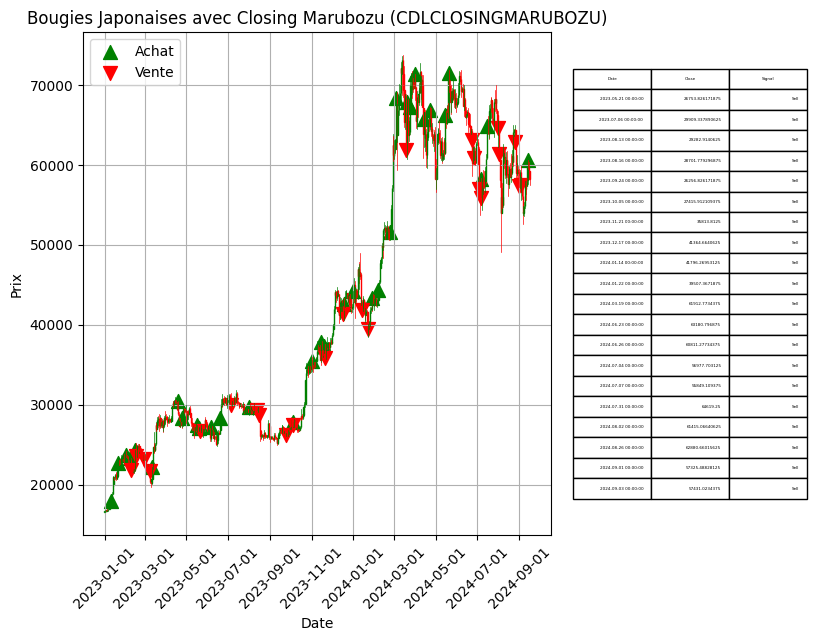

### Concealing Baby Swallow (CDLCONCEALBABYSWALL)

**Description:** Pattern baissier.


Aucun pattern Concealing Baby Swallow (CDLCONCEALBABYSWALL) détecté dans les données.


### Counterattack (CDLCOUNTERATTACK)

**Description:** Pattern de renversement haussier ou baissier.


Aucun pattern Counterattack (CDLCOUNTERATTACK) détecté dans les données.


### Dark Cloud Cover (CDLDARKCLOUDCOVER)

**Description:** Inversion baissière.


Aucun pattern Dark Cloud Cover (CDLDARKCLOUDCOVER) détecté dans les données.


### Doji (CDLDOJI)

**Description:** Indécision dans le marché.


Pattern détecté pour Doji (CDLDOJI) aux dates suivantes :
     Doji (CDLDOJI)
536             100
538             100
547             100
564             100
573             100
587             100
601             100
602             100
608             100
615             100


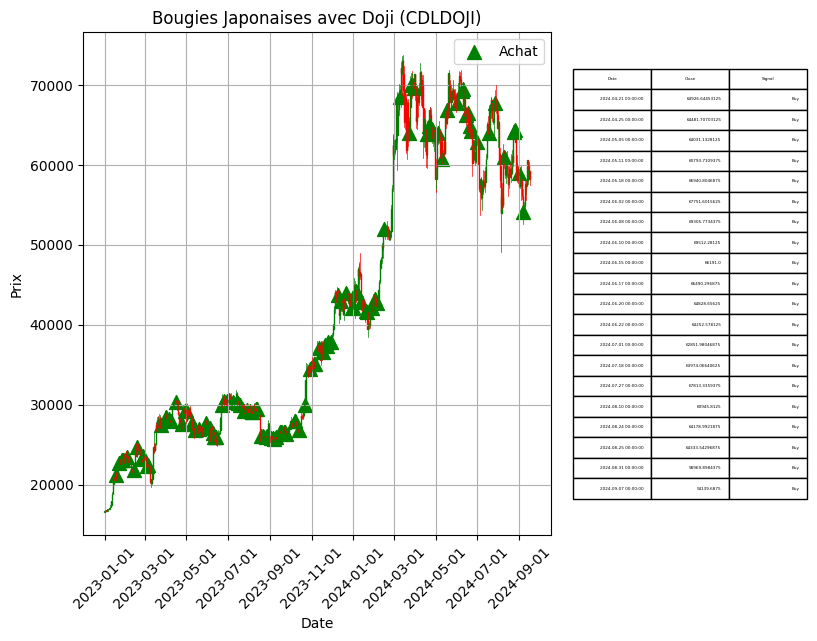

### Doji Star (CDLDOJISTAR)

**Description:** Pattern d’inversion haussier ou baissier.


Pattern détecté pour Doji Star (CDLDOJISTAR) aux dates suivantes :
     Doji Star (CDLDOJISTAR)
195                      100
279                     -100
377                      100
410                     -100
524                      100
601                     -100


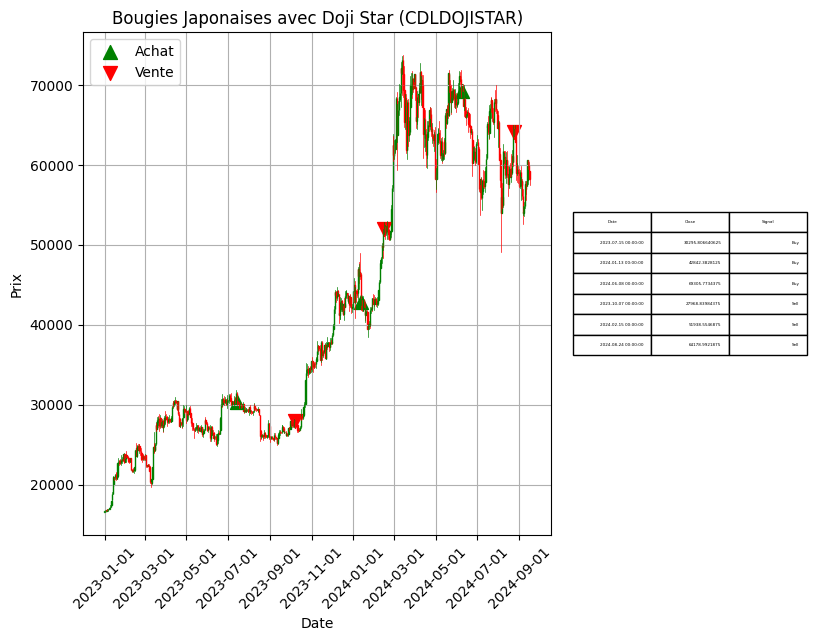

### Dragonfly Doji (CDLDRAGONFLYDOJI)

**Description:** Indique un potentiel retournement haussier.


Pattern détecté pour Dragonfly Doji (CDLDRAGONFLYDOJI) aux dates suivantes :
     Dragonfly Doji (CDLDRAGONFLYDOJI)
209                                100
216                                100
232                                100
247                                100
251                                100
259                                100
265                                100
279                                100
315                                100
369                                100


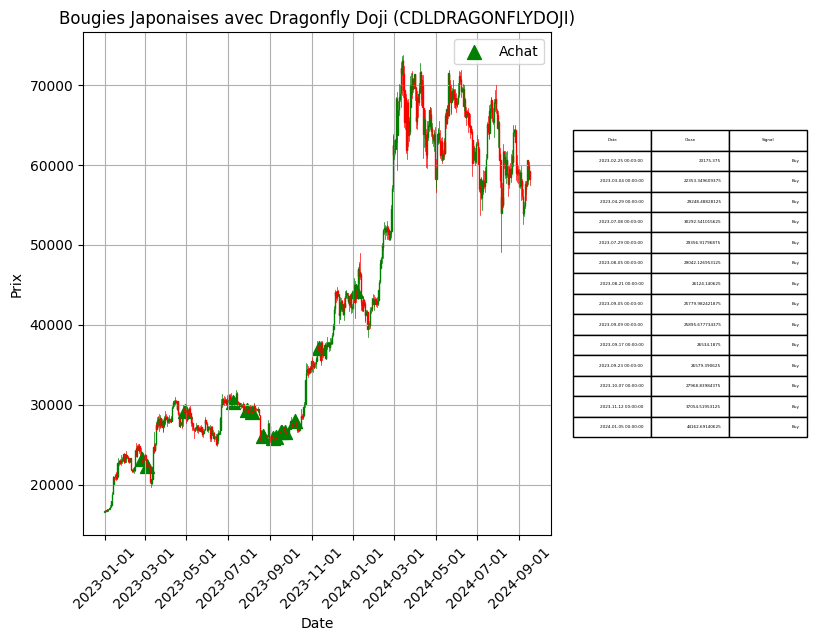

### Engulfing Pattern (CDLENGULFING)

**Description:** Pattern de renversement haussier ou baissier.


Pattern détecté pour Engulfing Pattern (CDLENGULFING) aux dates suivantes :
     Engulfing Pattern (CDLENGULFING)
552                               100
558                               100
565                               100
574                               100
575                              -100
591                              -100
596                               100
600                               100
603                              -100
613                              -100


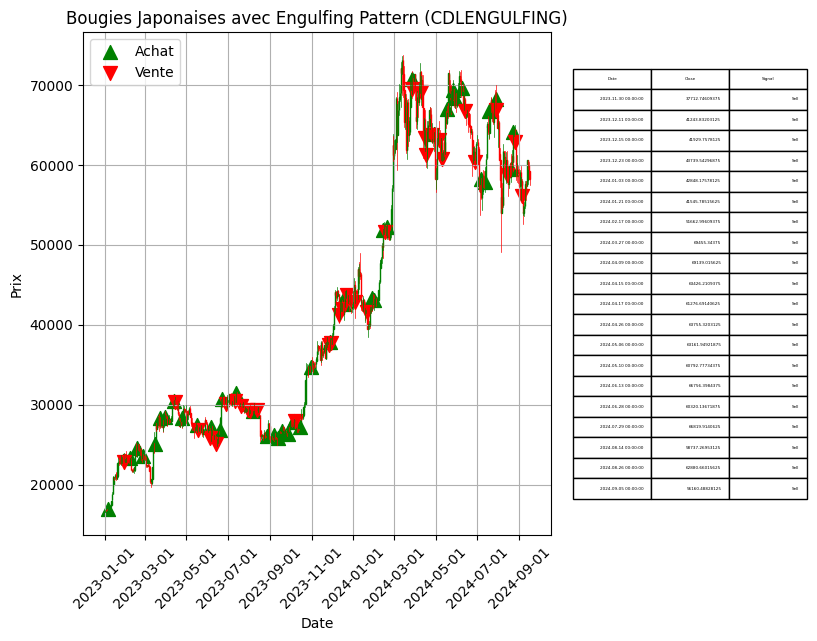

### Evening Doji Star (CDLEVENINGDOJISTAR)

**Description:** Inversion baissière.


Aucun pattern Evening Doji Star (CDLEVENINGDOJISTAR) détecté dans les données.


### Evening Star (CDLEVENINGSTAR)

**Description:** Inversion baissière après une tendance haussière.


Aucun pattern Evening Star (CDLEVENINGSTAR) détecté dans les données.


### Up/Down-gap side-by-side white lines (CDLGAPSIDESIDEWHITE)

**Description:** Continuation de tendance.


Pattern détecté pour Up/Down-gap side-by-side white lines (CDLGAPSIDESIDEWHITE) aux dates suivantes :
     Up/Down-gap side-by-side white lines (CDLGAPSIDESIDEWHITE)
602                                                100         


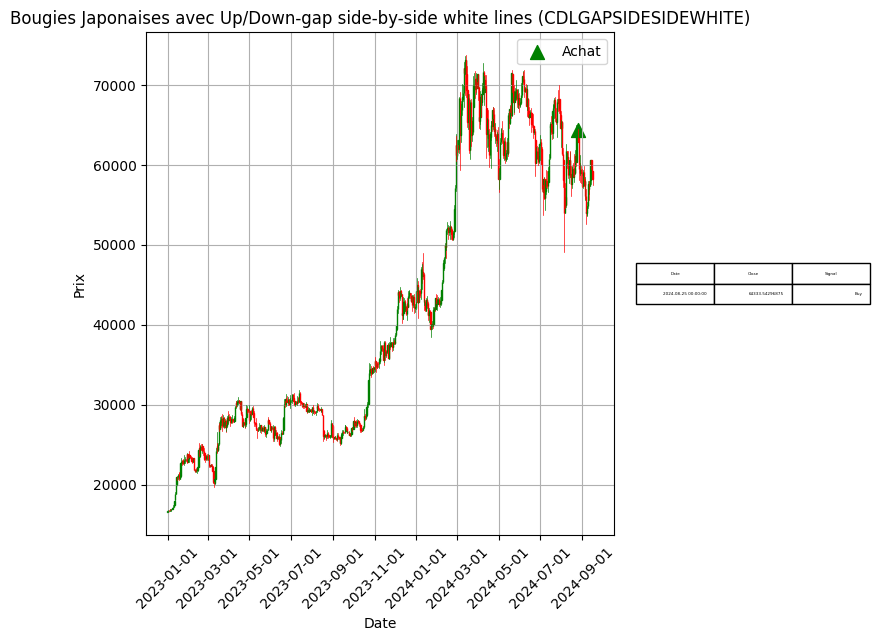

### Gravestone Doji (CDLGRAVESTONEDOJI)

**Description:** Indique un potentiel retournement baissier.


Pattern détecté pour Gravestone Doji (CDLGRAVESTONEDOJI) aux dates suivantes :
     Gravestone Doji (CDLGRAVESTONEDOJI)
132                                  100
199                                  100
244                                  100
286                                  100
454                                  100
524                                  100
531                                  100
547                                  100
608                                  100
615                                  100


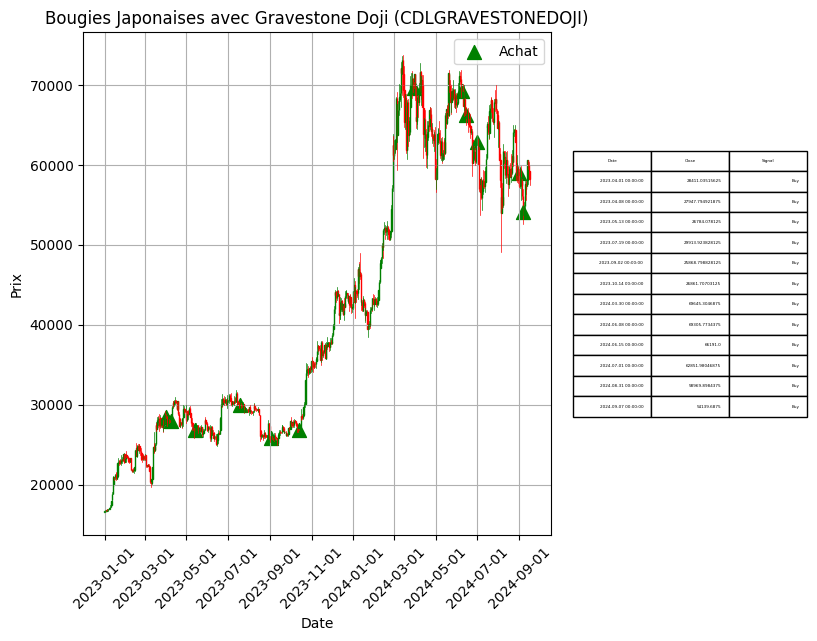

### Hammer (CDLHAMMER)

**Description:** Indique un retournement haussier.


Pattern détecté pour Hammer (CDLHAMMER) aux dates suivantes :
     Hammer (CDLHAMMER)
232                 100
233                 100
247                 100
259                 100
265                 100
299                 100
356                 100
412                 100
482                 100
576                 100


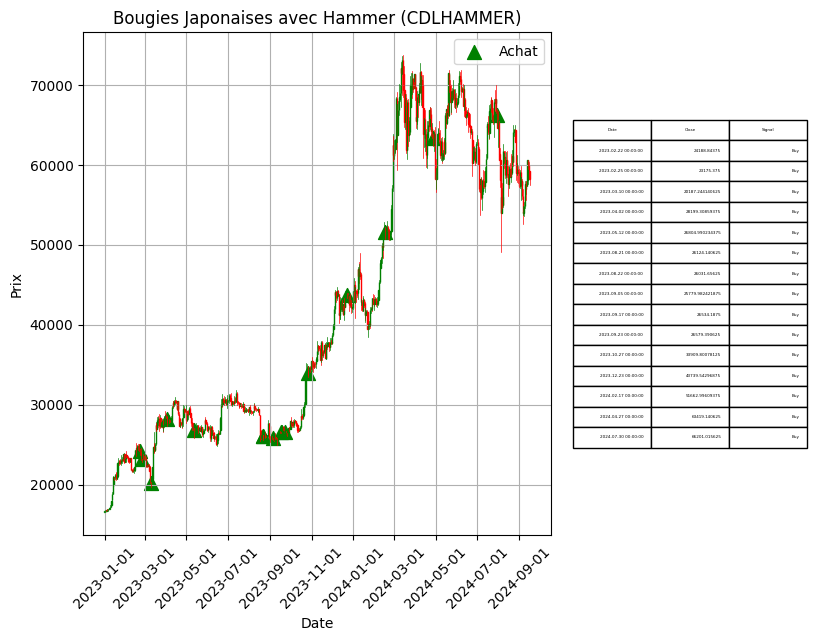

### Hanging Man (CDLHANGINGMAN)

**Description:** Inversion baissière.


Pattern détecté pour Hanging Man (CDLHANGINGMAN) aux dates suivantes :
     Hanging Man (CDLHANGINGMAN)
188                         -100
232                         -100
233                         -100
370                         -100
567                         -100


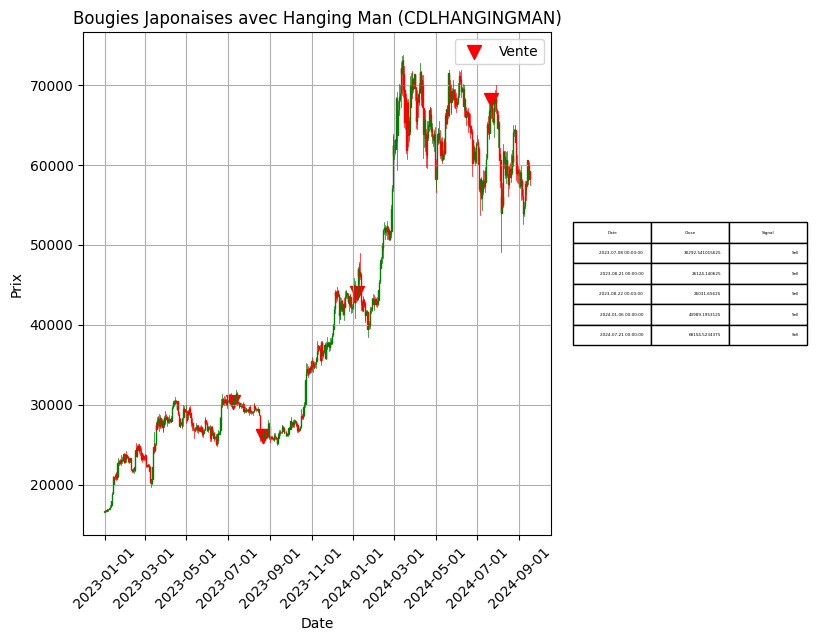

### Harami Pattern (CDLHARAMI)

**Description:** Pattern de renversement.


Pattern détecté pour Harami Pattern (CDLHARAMI) aux dates suivantes :
     Harami Pattern (CDLHARAMI)
465                         100
496                         100
501                        -100
506                        -100
554                         100
573                        -100
578                         100
599                        -100
615                         100
622                        -100


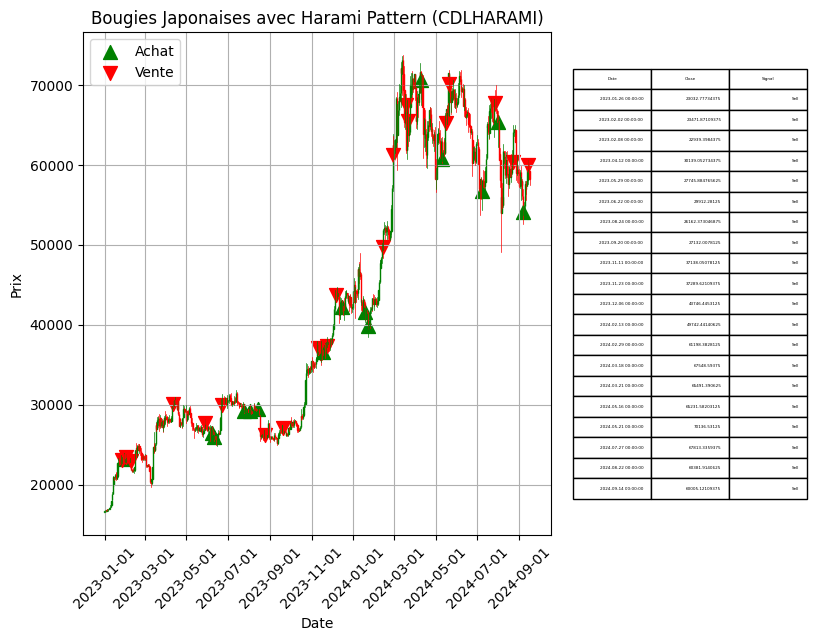

### Harami Cross Pattern (CDLHARAMICROSS)

**Description:** Inversion haussière ou baissière.


Pattern détecté pour Harami Cross Pattern (CDLHARAMICROSS) aux dates suivantes :
     Harami Cross Pattern (CDLHARAMICROSS)
25                                    -100
161                                    100
172                                   -100
205                                    100
214                                    100
326                                   -100
496                                    100
573                                   -100
615                                    100


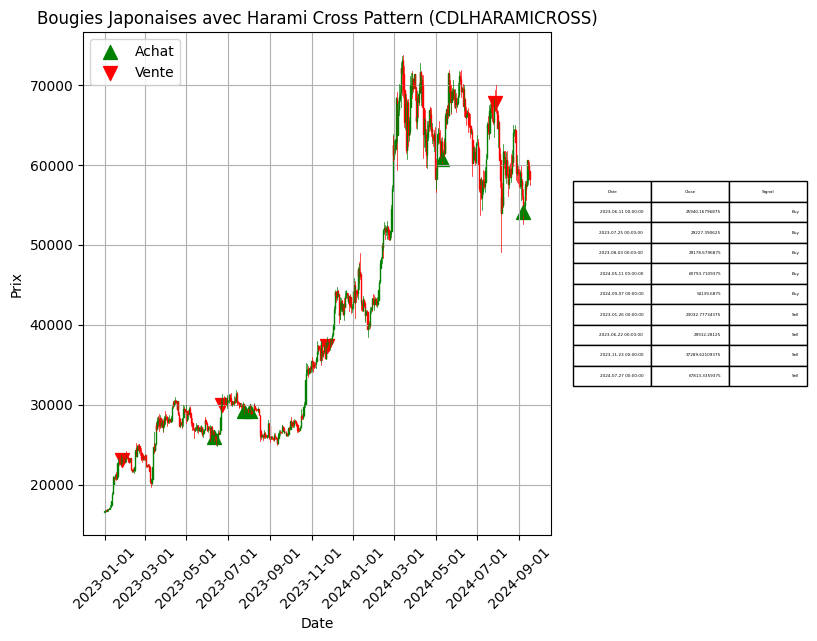

### High-Wave Candle (CDLHIGHWAVE)

**Description:** Indécision sur le marché.


Pattern détecté pour High-Wave Candle (CDLHIGHWAVE) aux dates suivantes :
     High-Wave Candle (CDLHIGHWAVE)
518                             100
524                            -100
526                            -100
533                            -100
536                            -100
564                            -100
573                            -100
587                             100
601                             100
602                             100


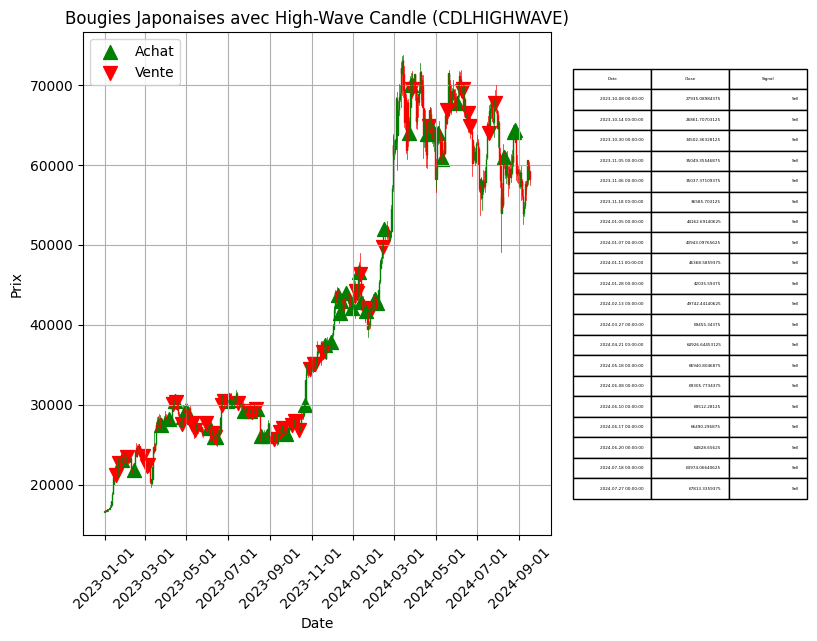

### Hikkake Pattern (CDLHIKKAKE)

**Description:** Pattern de continuation ou de renversement.


Pattern détecté pour Hikkake Pattern (CDLHIKKAKE) aux dates suivantes :
     Hikkake Pattern (CDLHIKKAKE)
546                          -100
549                          -200
584                          -100
600                          -100
602                          -100
603                          -200
609                           100
614                           100
619                           100
620                           200


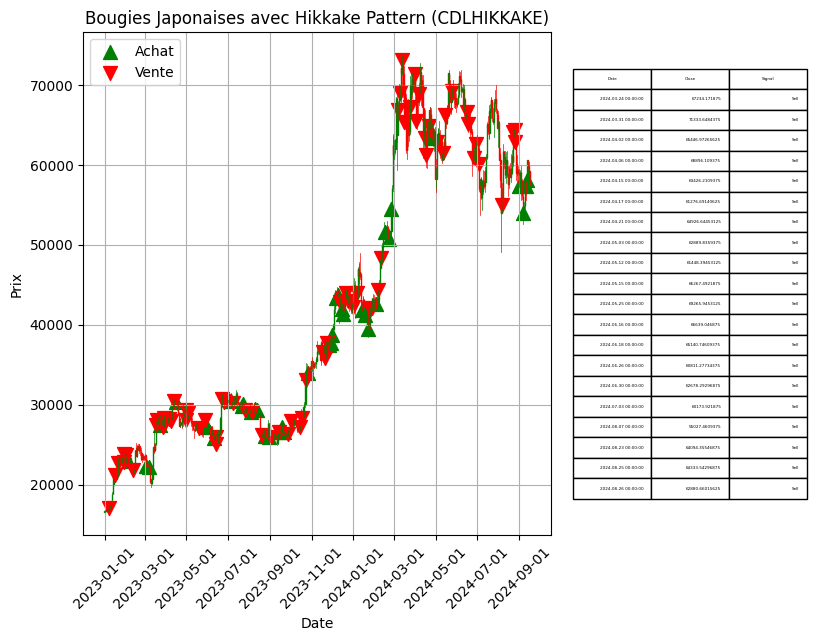

### Modified Hikkake Pattern (CDLHIKKAKEMOD)

**Description:** Variation du Hikkake.


Pattern détecté pour Modified Hikkake Pattern (CDLHIKKAKEMOD) aux dates suivantes :
     Modified Hikkake Pattern (CDLHIKKAKEMOD)
119                                      -100
120                                      -200
371                                      -100
386                                       100


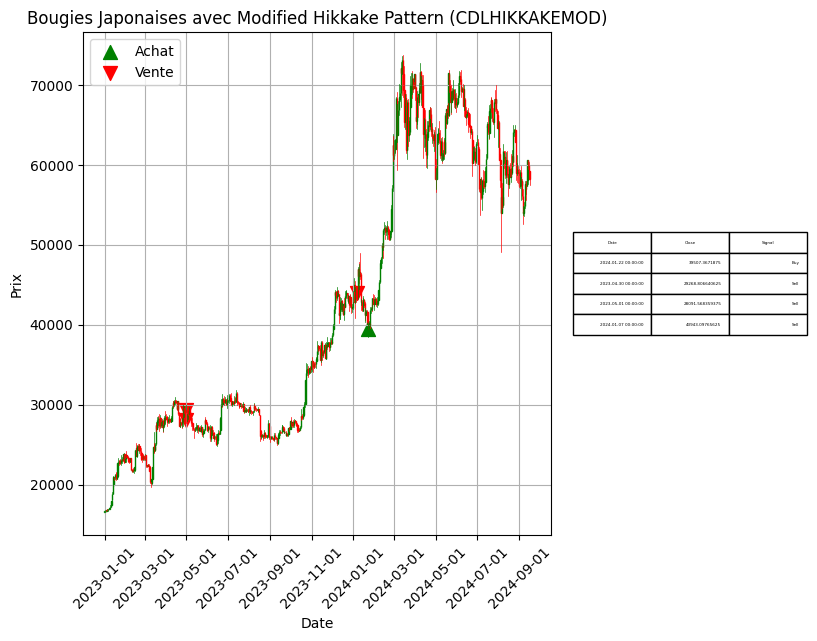

### Homing Pigeon (CDLHOMINGPIGEON)

**Description:** Inversion haussière.


Aucun pattern Homing Pigeon (CDLHOMINGPIGEON) détecté dans les données.


### Identical Three Crows (CDLIDENTICAL3CROWS)

**Description:** Inversion baissière.


Aucun pattern Identical Three Crows (CDLIDENTICAL3CROWS) détecté dans les données.


### In-Neck Pattern (CDLINNECK)

**Description:** Continuation baissière.


Aucun pattern In-Neck Pattern (CDLINNECK) détecté dans les données.


### Inverted Hammer (CDLINVERTEDHAMMER)

**Description:** Inversion haussière.


Pattern détecté pour Inverted Hammer (CDLINVERTEDHAMMER) aux dates suivantes :
     Inverted Hammer (CDLINVERTEDHAMMER)
195                                  100
237                                  100
524                                  100
557                                  100
608                                  100


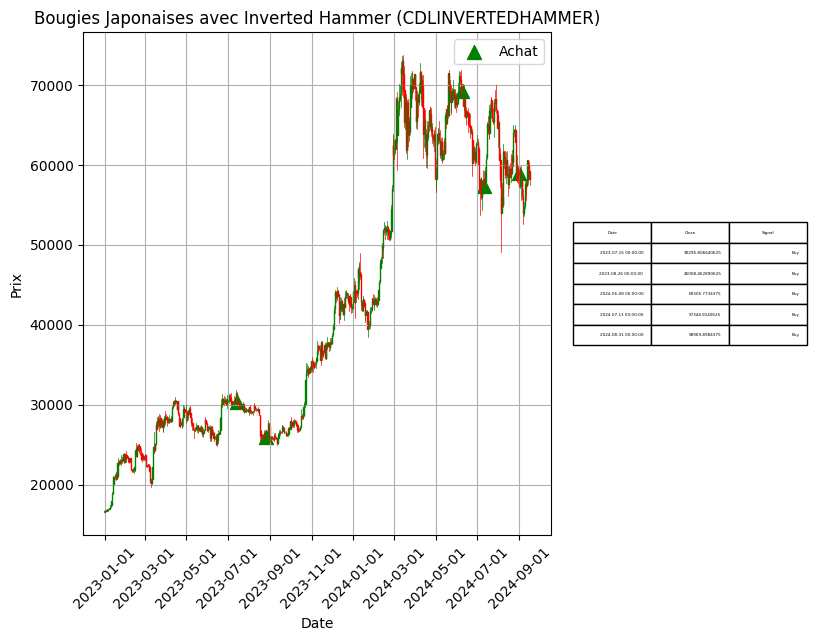

### Kicking (CDLKICKING)

**Description:** Pattern de renversement haussier ou baissier.


Aucun pattern Kicking (CDLKICKING) détecté dans les données.


### Kicking by Length (CDLKICKINGBYLENGTH)

**Description:** Renversement basé sur la longueur des marubozus.


Aucun pattern Kicking by Length (CDLKICKINGBYLENGTH) détecté dans les données.


### Ladder Bottom (CDLLADDERBOTTOM)

**Description:** Inversion haussière.


Aucun pattern Ladder Bottom (CDLLADDERBOTTOM) détecté dans les données.


### Long Legged Doji (CDLLONGLEGGEDDOJI)

**Description:** Indécision, possible retournement.


Pattern détecté pour Long Legged Doji (CDLLONGLEGGEDDOJI) aux dates suivantes :
     Long Legged Doji (CDLLONGLEGGEDDOJI)
536                                   100
538                                   100
547                                   100
564                                   100
573                                   100
587                                   100
601                                   100
602                                   100
608                                   100
615                                   100


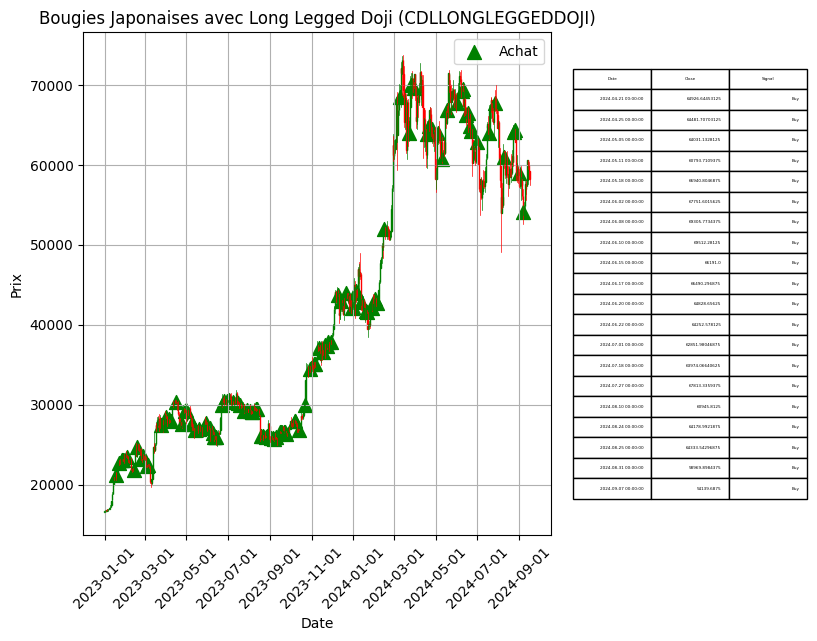

### Long Line Candle (CDLLONGLINE)

**Description:** Bougie à longue distance entre l’ouverture et la clôture.


Pattern détecté pour Long Line Candle (CDLLONGLINE) aux dates suivantes :
     Long Line Candle (CDLLONGLINE)
569                            -100
572                             100
577                            -100
579                            -100
598                             100
603                            -100
609                            -100
610                             100
613                            -100
621                             100


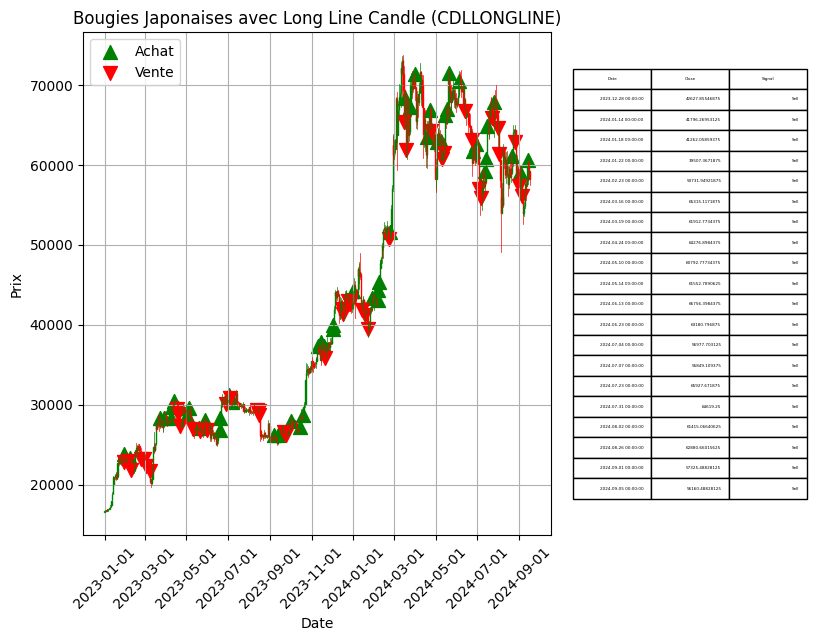

### Marubozu (CDLMARUBOZU)

**Description:** Bougie sans mèche, indique une forte direction.


Pattern détecté pour Marubozu (CDLMARUBOZU) aux dates suivantes :
     Marubozu (CDLMARUBOZU)
386                    -100
448                     100
455                     100
477                     100
505                     100
553                    -100
561                     100
579                    -100
603                    -100
609                    -100


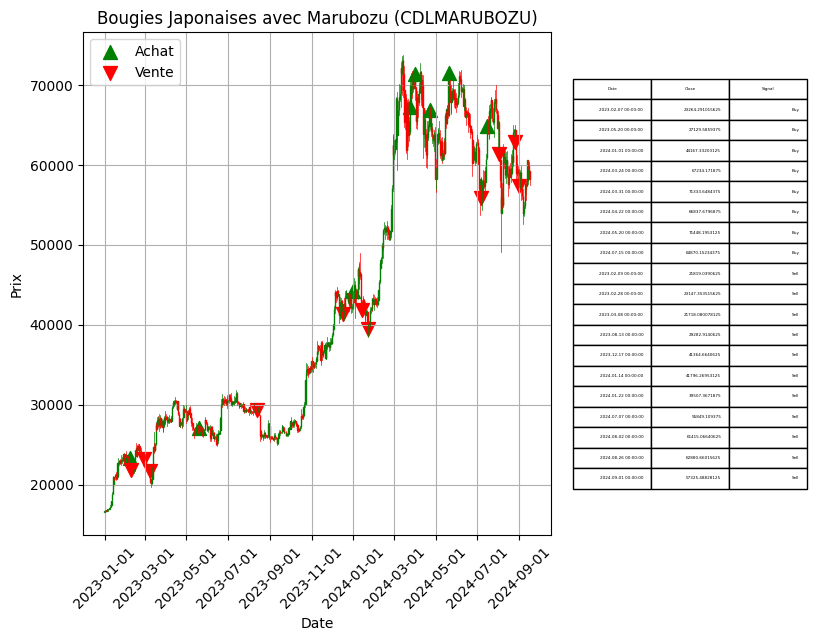

### Matching Low (CDLMATCHINGLOW)

**Description:** Inversion haussière.


Pattern détecté pour Matching Low (CDLMATCHINGLOW) aux dates suivantes :
     Matching Low (CDLMATCHINGLOW)
196                            100
216                            100
217                            100
247                            100
248                            100
251                            100
259                            100
309                            100
371                            100
524                            100


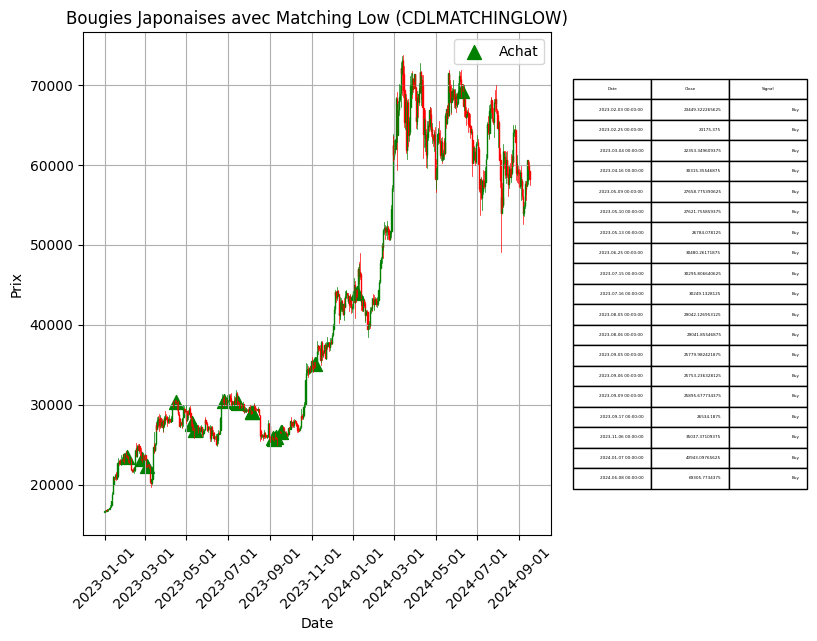

### Mat Hold (CDLMATHOLD)

**Description:** Continuation de tendance haussière ou baissière.


Aucun pattern Mat Hold (CDLMATHOLD) détecté dans les données.


### Morning Doji Star (CDLMORNINGDOJISTAR)

**Description:** Inversion haussière.


Aucun pattern Morning Doji Star (CDLMORNINGDOJISTAR) détecté dans les données.


### Morning Star (CDLMORNINGSTAR)

**Description:** Inversion haussière après une tendance baissière.


Pattern détecté pour Morning Star (CDLMORNINGSTAR) aux dates suivantes :
     Morning Star (CDLMORNINGSTAR)
37                             100
276                            100


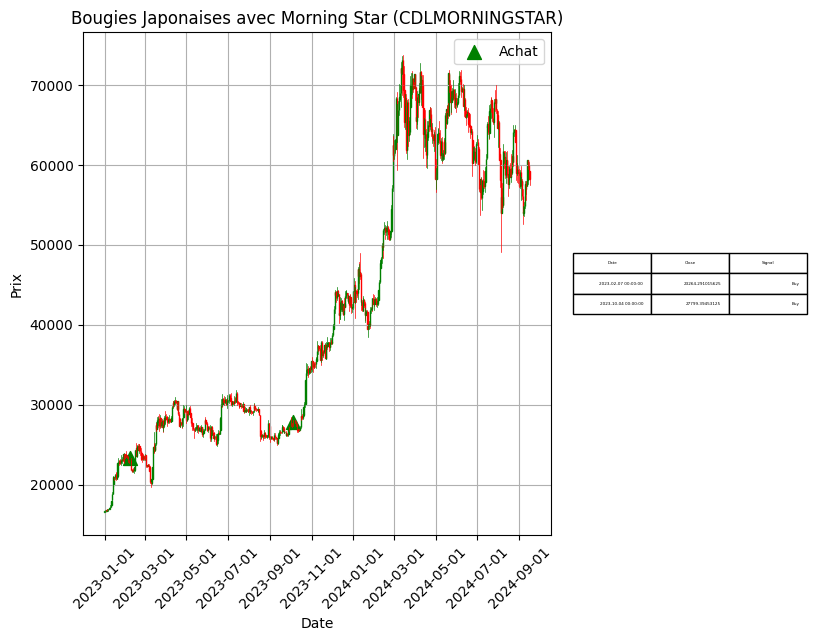

### On-Neck Pattern (CDLONNECK)

**Description:** Continuation baissière.


Aucun pattern On-Neck Pattern (CDLONNECK) détecté dans les données.


### Piercing Pattern (CDLPIERCING)

**Description:** Inversion haussière.


Pattern détecté pour Piercing Pattern (CDLPIERCING) aux dates suivantes :
     Piercing Pattern (CDLPIERCING)
325                             100


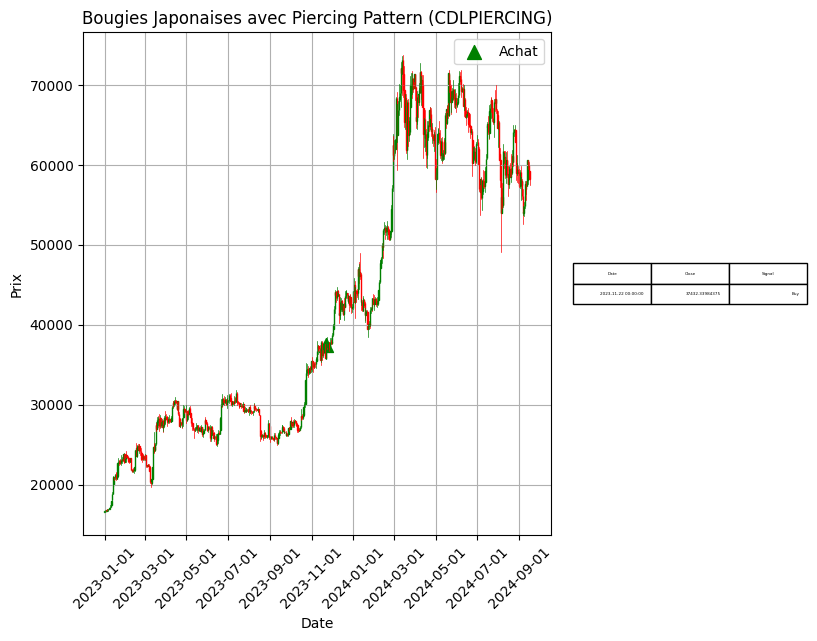

### Rickshaw Man (CDLRICKSHAWMAN)

**Description:** Indique une indécision.


Pattern détecté pour Rickshaw Man (CDLRICKSHAWMAN) aux dates suivantes :
     Rickshaw Man (CDLRICKSHAWMAN)
526                            100
533                            100
538                            100
564                            100
573                            100
587                            100
601                            100
602                            100
608                            100
615                            100


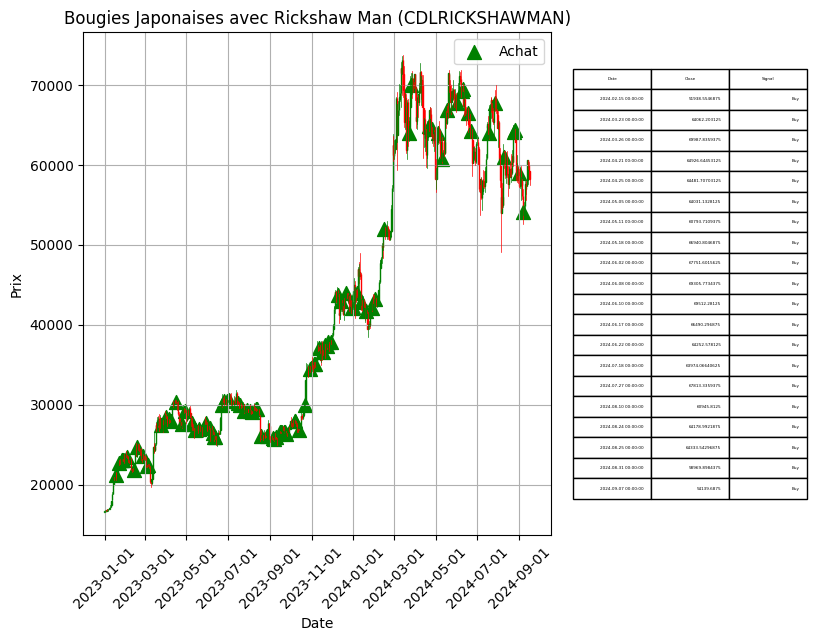

### Rising/Falling Three Methods (CDLRISEFALL3METHODS)

**Description:** Pattern de continuation.


Pattern détecté pour Rising/Falling Three Methods (CDLRISEFALL3METHODS) aux dates suivantes :
     Rising/Falling Three Methods (CDLRISEFALL3METHODS)
372                                                100 


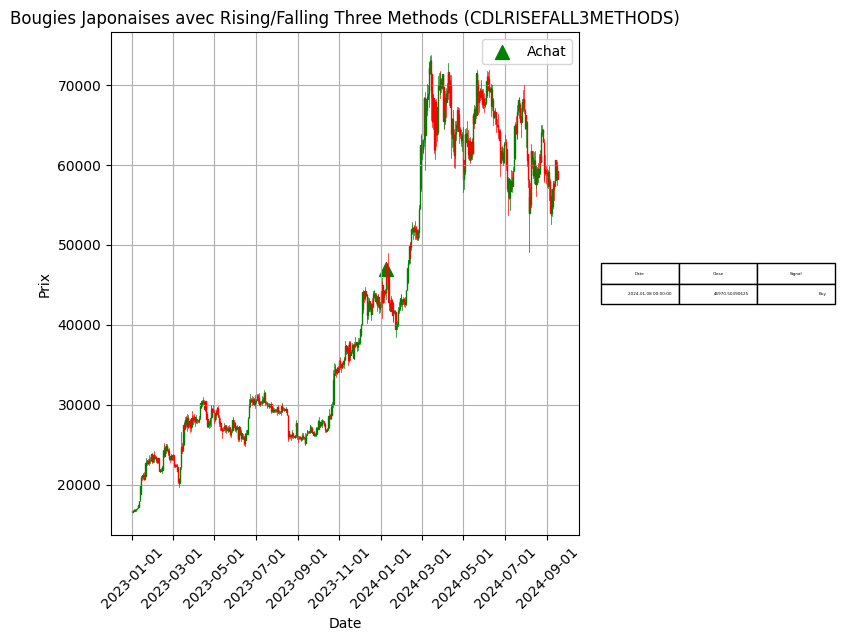

### Separating Lines (CDLSEPARATINGLINES)

**Description:** Continuation de tendance.


Pattern détecté pour Separating Lines (CDLSEPARATINGLINES) aux dates suivantes :
     Separating Lines (CDLSEPARATINGLINES)
120                                   -100
224                                   -100
287                                    100
344                                   -100
378                                   -100
477                                    100


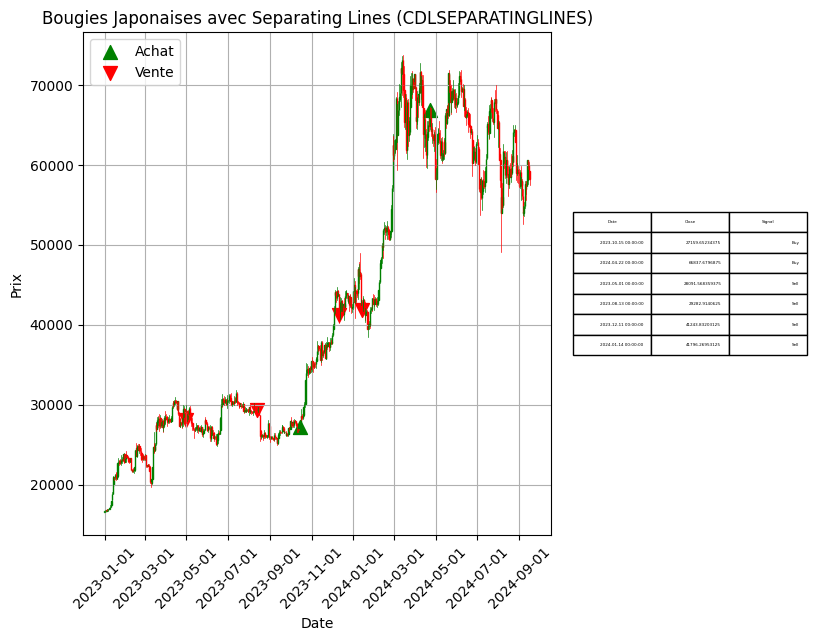

### Shooting Star (CDLSHOOTINGSTAR)

**Description:** Inversion baissière.


Pattern détecté pour Shooting Star (CDLSHOOTINGSTAR) aux dates suivantes :
     Shooting Star (CDLSHOOTINGSTAR)
245                             -100
328                             -100
384                             -100
434                             -100
462                             -100
521                             -100


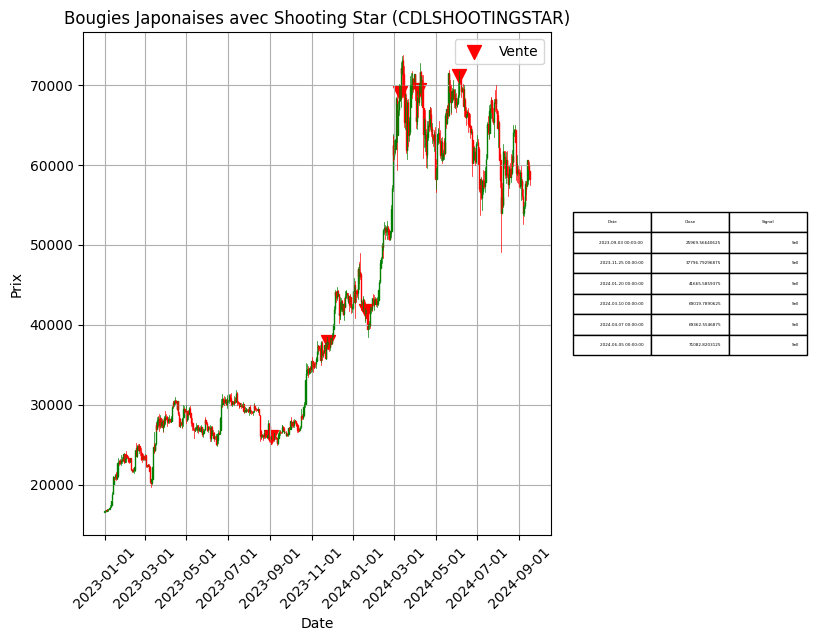

### Short Line Candle (CDLSHORTLINE)

**Description:** Bougie avec une petite différence entre ouverture et clôture.


Pattern détecté pour Short Line Candle (CDLSHORTLINE) aux dates suivantes :
     Short Line Candle (CDLSHORTLINE)
588                              -100
594                               100
596                               100
599                              -100
601                               100
608                              -100
616                               100
620                               100
622                              -100
623                              -100


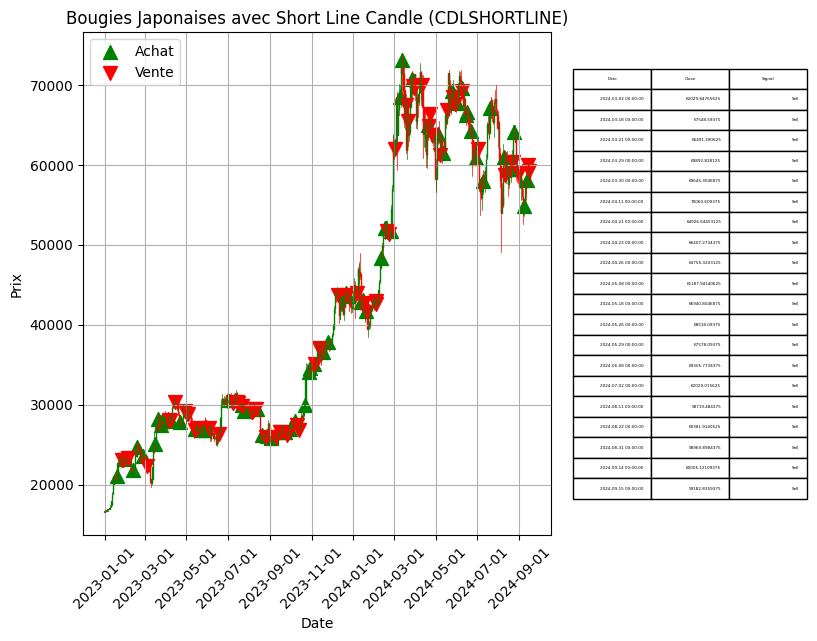

### Spinning Top (CDLSPINNINGTOP)

**Description:** Indique une indécision.


Pattern détecté pour Spinning Top (CDLSPINNINGTOP) aux dates suivantes :
     Spinning Top (CDLSPINNINGTOP)
573                           -100
587                            100
589                            100
601                            100
602                            100
605                           -100
607                           -100
608                           -100
615                            100
619                           -100


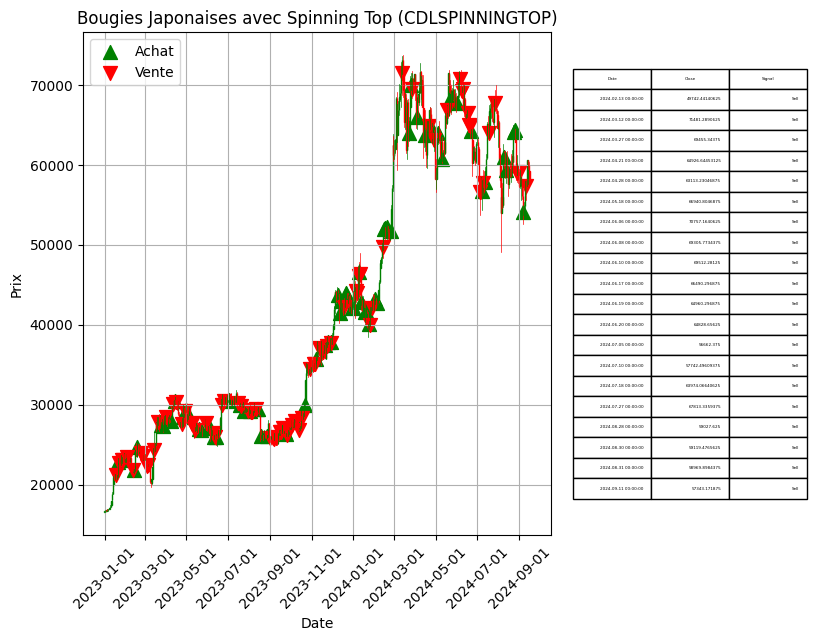

### Stalled Pattern (CDLSTALLEDPATTERN)

**Description:** Inversion de tendance haussière.


Pattern détecté pour Stalled Pattern (CDLSTALLEDPATTERN) aux dates suivantes :
     Stalled Pattern (CDLSTALLEDPATTERN)
562                                 -100


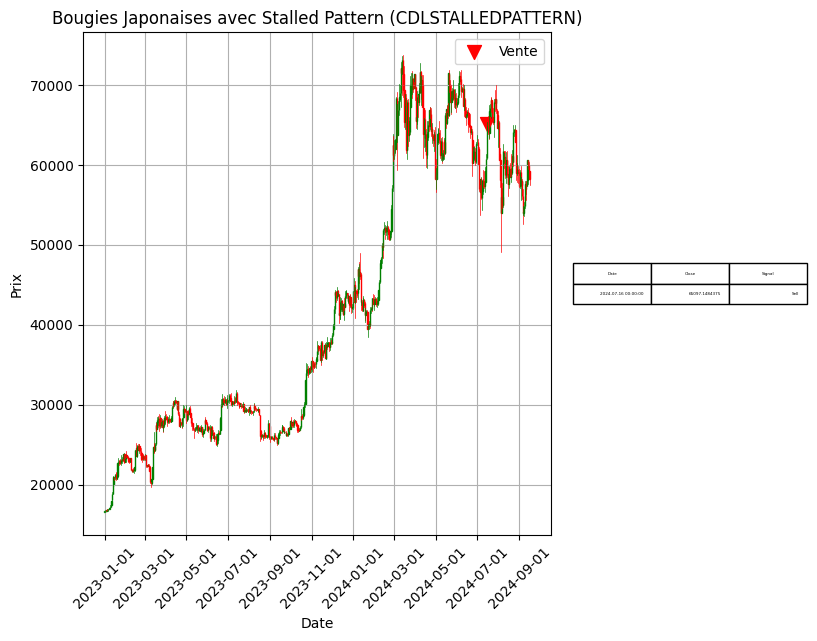

### Stick Sandwich (CDLSTICKSANDWICH)

**Description:** Inversion haussière.


Aucun pattern Stick Sandwich (CDLSTICKSANDWICH) détecté dans les données.


### Takuri (CDLTAKURI)

**Description:** Doji avec longue ombre inférieure, retournement haussier.


Pattern détecté pour Takuri (CDLTAKURI) aux dates suivantes :
     Takuri (CDLTAKURI)
223                 100
232                 100
247                 100
251                 100
259                 100
265                 100
279                 100
315                 100
369                 100
384                 100


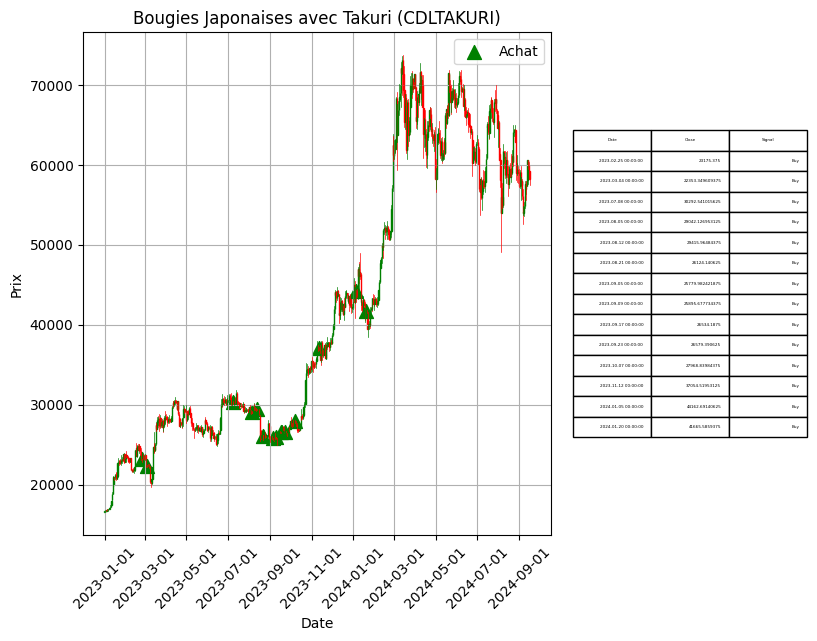

### Tasuki Gap (CDLTASUKIGAP)

**Description:** Pattern de continuation.


Aucun pattern Tasuki Gap (CDLTASUKIGAP) détecté dans les données.


### Thrusting Pattern (CDLTHRUSTING)

**Description:** Inversion haussière.


Aucun pattern Thrusting Pattern (CDLTHRUSTING) détecté dans les données.


### Tristar Pattern (CDLTRISTAR)

**Description:** Inversion haussière ou baissière.


Aucun pattern Tristar Pattern (CDLTRISTAR) détecté dans les données.


### Unique 3 River (CDLUNIQUE3RIVER)

**Description:** Inversion haussière.


Aucun pattern Unique 3 River (CDLUNIQUE3RIVER) détecté dans les données.


### Upside Gap Two Crows (CDLUPSIDEGAP2CROWS)

**Description:** Inversion baissière.


Aucun pattern Upside Gap Two Crows (CDLUPSIDEGAP2CROWS) détecté dans les données.


### Upside/Downside Gap Three Methods (CDLXSIDEGAP3METHODS)

**Description:** Pattern de continuation.


Pattern détecté pour Upside/Downside Gap Three Methods (CDLXSIDEGAP3METHODS) aux dates suivantes :
     Upside/Downside Gap Three Methods (CDLXSIDEGAP3METHODS)
41                                                -100      
95                                                 100      
152                                               -100      
246                                                100      
398                                                100      
419                                               -100      
494                                               -100      
511                                                100      
593                                               -100      
610                                               -100      


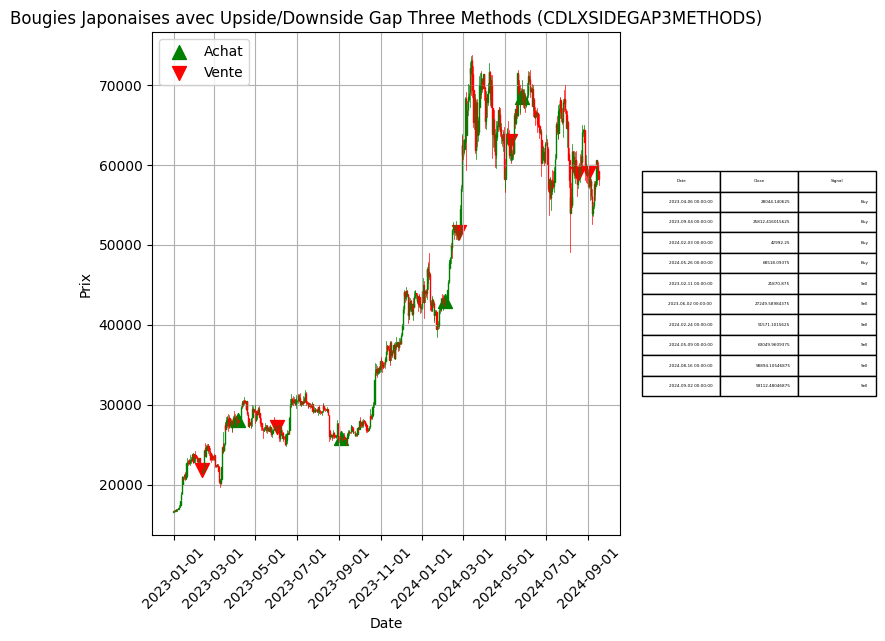

In [26]:

# Fonction pour détecter les patterns et afficher les bougies, avec une page par pattern
def detect_and_display_patterns(data, patterns):
    """
    Détecte et affiche les patterns de chandeliers japonais et les signaux de vente/achat.

    Parameters:
    - data (pd.DataFrame): Données OHLC (Open, High, Low, Close) des marchés.
    - patterns (list): Liste de dictionnaires définissant chaque pattern à calculer.
    """
    print(f"Nombre de patterns : {len(patterns)}")

    for pattern in patterns:
        name = pattern['name']
        description = pattern['description']
        func = pattern['func']

        # Afficher la description du pattern
        display(Markdown(f"### {name}\n\n**Description:** {description}\n"))

        try:
            # Appliquer la fonction TA-Lib pour détecter le pattern
            result = func(data['Open'], data['High'], data['Low'], data['Close'])

            # Ajouter les résultats au DataFrame
            data[name] = result

            # Filtrer les jours où le pattern est détecté (non-nul)
            pattern_days = data[data[name] != 0]

            if not pattern_days.empty:
                print(f"Pattern détecté pour {name} aux dates suivantes :")
                print(pattern_days[[name]].tail(10))  # Afficher les 10 derniers résultats

                # Différencier entre achat et vente
                buy_signals = pattern_days[pattern_days[name] > 0]
                sell_signals = pattern_days[pattern_days[name] < 0]

                # Afficher les bougies avec les signaux d'achat/vente sur une nouvelle page
                plot_candlestick_with_signals(data, name, buy_signals, sell_signals)

            else:
                print(f"Aucun pattern {name} détecté dans les données.")

        except Exception as e:
            print(f"Erreur lors de la détection du pattern {name}: {e}")

# Appel de la fonction pour détecter et afficher les patterns
detect_and_display_patterns(data, patterns)
